<a href="https://colab.research.google.com/github/electrodrago/generative-AI/blob/main/basic_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import library

- Pytorch: <a href="https://pytorch.org/">https://pytorch.org/</a>
- Pdb: <a href="https://docs.python.org/3/library/pdb.html">https://docs.python.org/3/library/pdb.html</a>

In [ ]:
# Libs
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms                                                # Transform training data in many different ways
from torchvision.datasets import MNIST                                            # Dataset
from torchvision.utils import make_grid                                           # Make a grid of images
from tqdm.auto import tqdm                                                        # Show training process
import matplotlib.pyplot as plt

## Visualization function

In [ ]:
def show(tensor, ch=1, size=(28, 28), num=16):
  # tensor: 128 x 784 (128 for batch size and 784 = 28 x 28)
  data = tensor.detach().cpu().view(-1, ch, *size)                                # Only visualize not take any training, Reshape to 28 x 28
  # Pytorch use channel x size x size, matplotlib use size x size x channel
  grid = make_grid(data[:num], nrow=4).permute(1, 2, 0)              # Take the first num (16) images and bring it to the right size
  plt.imshow(grid)
  plt.show()

##  Setup parameters and hyperparameters

In [ ]:
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()                                                  # This loss combines a Sigmoid layer and the BCELoss in one single class.

bs = 128
device = 'cuda'

''' The DataLoader supports both map-style and iterable-style datasets with 
single- or multi-process loading, customizing loading order and optional 
automatic batching (collation) and memory pinning.
'''
dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()), shuffle=True, batch_size=bs)

# Declare model



## Generator

In [ ]:
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)                                                       # Why inplace ? Lower memory! Inplace dont harm backprog
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim = 128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim),       # 64  -> 128
        genBlock(h_dim, h_dim*2),     # 128 -> 256
        genBlock(h_dim*2, h_dim*4),   # 256 -> 512
        genBlock(h_dim*4, h_dim*8),   # 512 -> 1024
        nn.Linear(h_dim*8, i_dim),    # 1024 -> 784 (28 x 28)
        nn.Sigmoid()
    )
  
  def forward(self, noise):
    return self.gen(noise)

# To device bring output of the function to the gpu device
def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

## Discriminator

In [ ]:
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)                                                         # To get away from problem call dying ReLU
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim = 256):
    super().__init__()
    self.disc = nn.Sequential(
        discBlock(i_dim, h_dim*4),    # 784 -> 1024
        discBlock(h_dim*4, h_dim*2),  # 1024 -> 512
        discBlock(h_dim*2, h_dim),  # 512 -> 256
        nn.Linear(h_dim, 1)           # 256 -> 1
    )
  
  def forward(self, image):
    return self.disc(image)

## Variable, optimizer

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([9, 3, 3, 6, 0, 5, 0, 1, 1, 0])


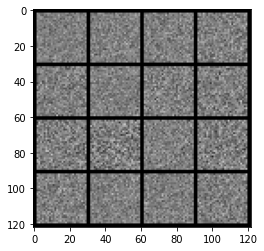

In [ ]:
x, y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

## Loss function

In [ ]:
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  pred = disc(fake)

  targets = torch.ones_like(pred)
  gen_loss = loss_func(pred, targets)

  return gen_loss

def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  
  disc_fake = disc(fake.detach()) # Not calculating the generator because this is the step for discriminator
  disc_fake_targets = torch.zeros_like(disc_fake)
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)
  
  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss = (disc_fake_loss + disc_real_loss) / 2
  
  return disc_loss

## Training loop

  0%|          | 0/469 [00:00<?, ?it/s]

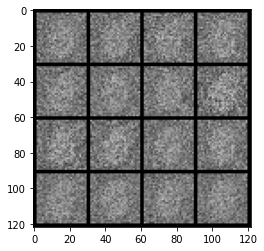

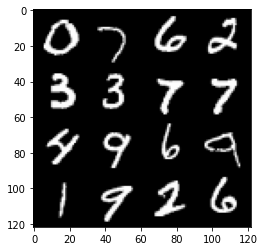

0: step 11700 / Gen loss: 0.7196187422672908 / disc_loss: 0.33700349777936944


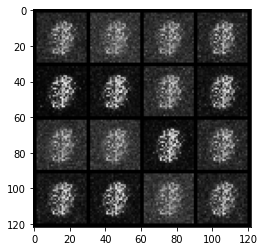

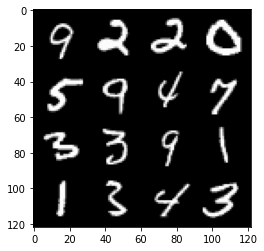

0: step 12000 / Gen loss: 4.154541155497235 / disc_loss: 0.03180396196121971


  0%|          | 0/469 [00:00<?, ?it/s]

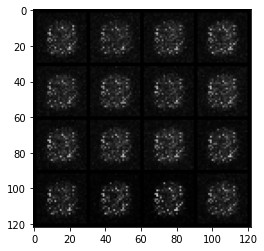

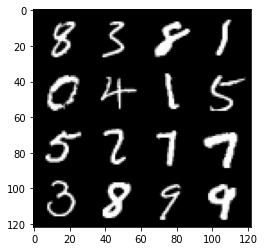

1: step 12300 / Gen loss: 4.245753717422485 / disc_loss: 0.013730784927805266


  0%|          | 0/469 [00:00<?, ?it/s]

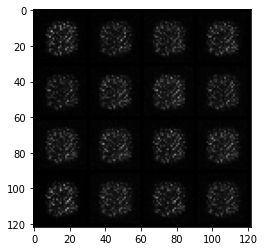

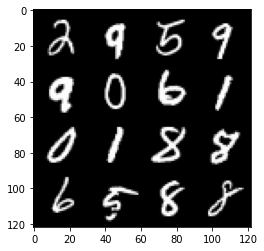

2: step 12600 / Gen loss: 3.733709988594056 / disc_loss: 0.02310677064582704


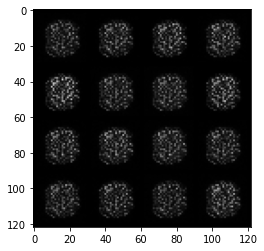

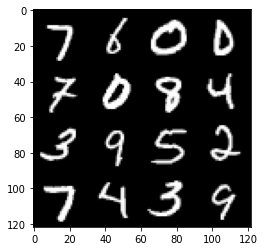

2: step 12900 / Gen loss: 3.9328300031026244 / disc_loss: 0.022061382252722975


  0%|          | 0/469 [00:00<?, ?it/s]

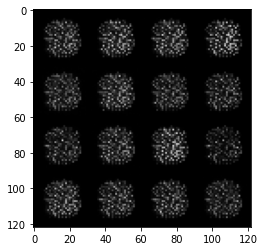

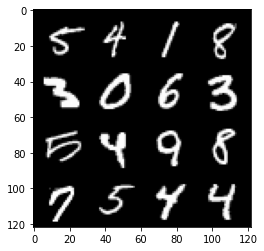

3: step 13200 / Gen loss: 5.0270175902048795 / disc_loss: 0.012642294373363257


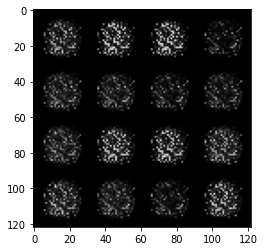

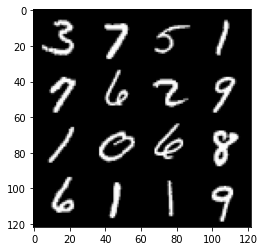

3: step 13500 / Gen loss: 5.996883150736488 / disc_loss: 0.007041068367349609


  0%|          | 0/469 [00:00<?, ?it/s]

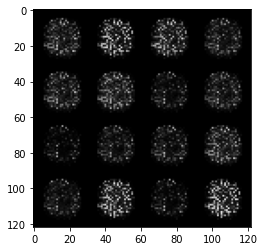

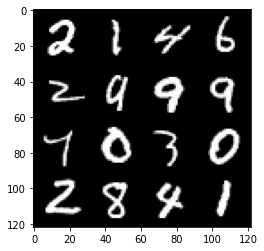

4: step 13800 / Gen loss: 6.377801534334819 / disc_loss: 0.005318695857810477


  0%|          | 0/469 [00:00<?, ?it/s]

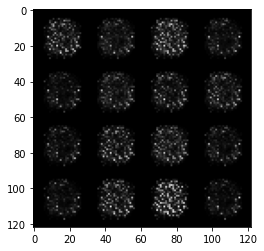

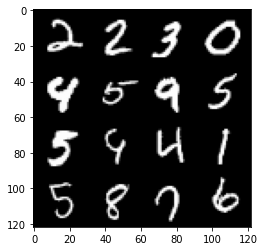

5: step 14100 / Gen loss: 6.74854645411173 / disc_loss: 0.004392479340313007


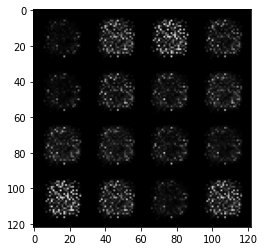

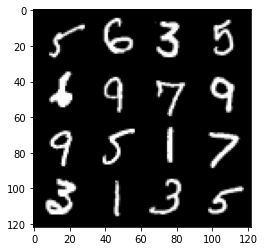

5: step 14400 / Gen loss: 6.65910410404205 / disc_loss: 0.0036302798287943016


  0%|          | 0/469 [00:00<?, ?it/s]

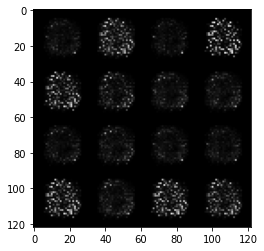

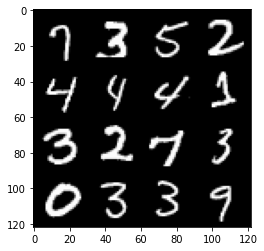

6: step 14700 / Gen loss: 6.285958574612934 / disc_loss: 0.003806106928192701


  0%|          | 0/469 [00:00<?, ?it/s]

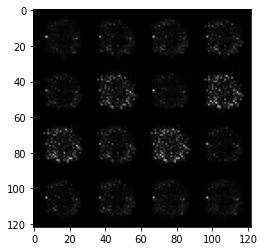

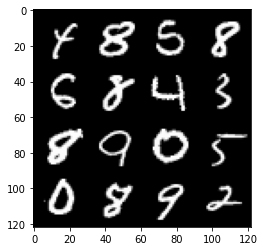

7: step 15000 / Gen loss: 5.802207886377968 / disc_loss: 0.004296039547771215


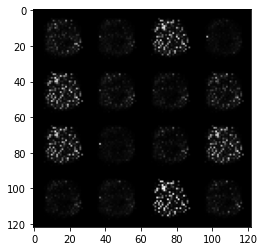

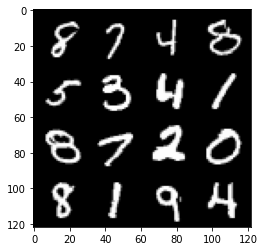

7: step 15300 / Gen loss: 5.652546952565509 / disc_loss: 0.004388528232617928


  0%|          | 0/469 [00:00<?, ?it/s]

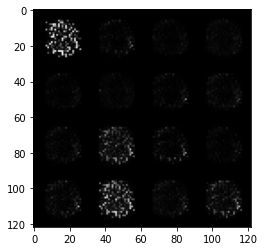

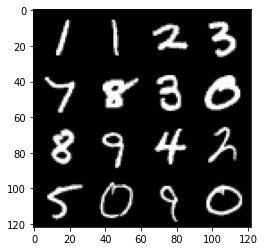

8: step 15600 / Gen loss: 5.745138309796657 / disc_loss: 0.003933561850960057


  0%|          | 0/469 [00:00<?, ?it/s]

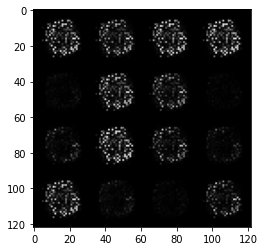

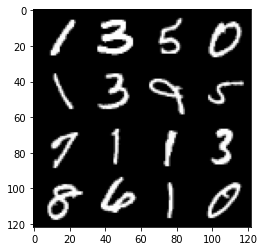

9: step 15900 / Gen loss: 5.850125009218847 / disc_loss: 0.003495774974192803


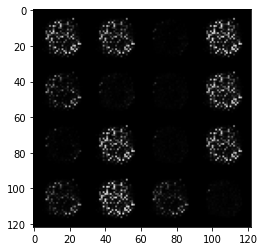

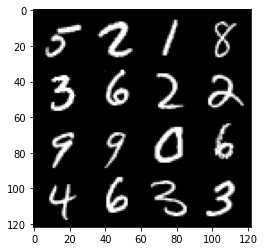

9: step 16200 / Gen loss: 6.330852292378741 / disc_loss: 0.0024684093710190306


  0%|          | 0/469 [00:00<?, ?it/s]

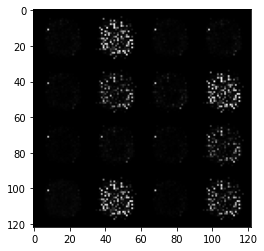

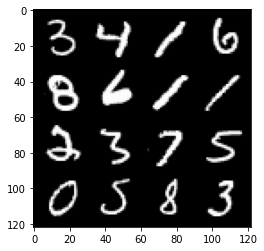

10: step 16500 / Gen loss: 6.495527135531107 / disc_loss: 0.002355594790230194


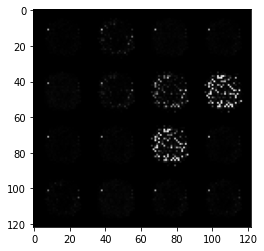

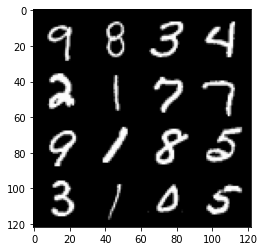

10: step 16800 / Gen loss: 6.928329677581784 / disc_loss: 0.0014602375503939885


  0%|          | 0/469 [00:00<?, ?it/s]

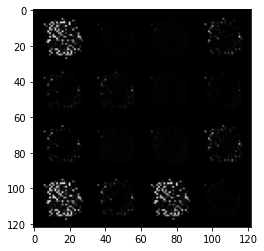

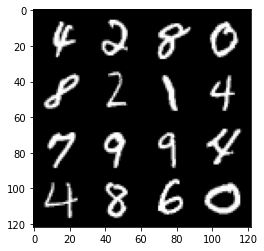

11: step 17100 / Gen loss: 6.975918353398642 / disc_loss: 0.0014571110149457433


  0%|          | 0/469 [00:00<?, ?it/s]

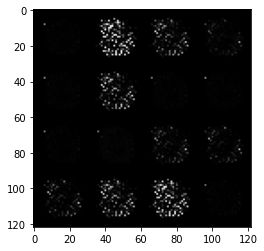

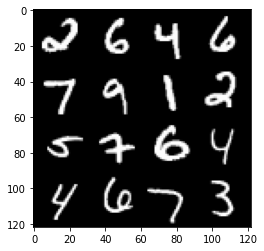

12: step 17400 / Gen loss: 7.134934193293251 / disc_loss: 0.00123376347978289


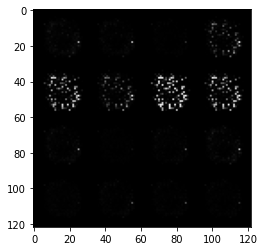

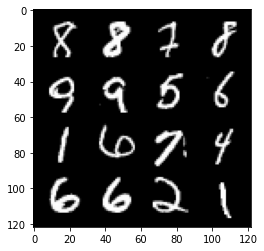

12: step 17700 / Gen loss: 7.0981132475535045 / disc_loss: 0.0010172697243009076


  0%|          | 0/469 [00:00<?, ?it/s]

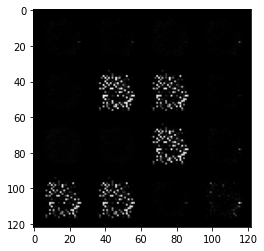

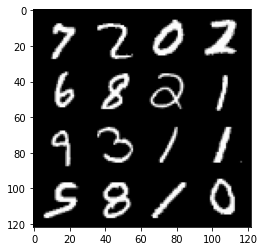

13: step 18000 / Gen loss: 7.140474923451745 / disc_loss: 0.0008932357271745179


  0%|          | 0/469 [00:00<?, ?it/s]

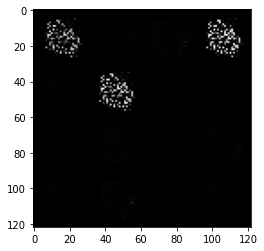

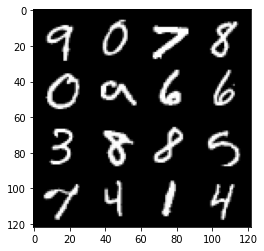

14: step 18300 / Gen loss: 7.7195585107803355 / disc_loss: 0.0008209510008843305


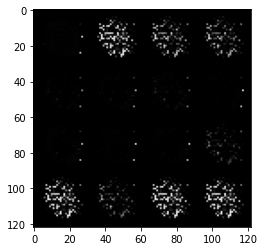

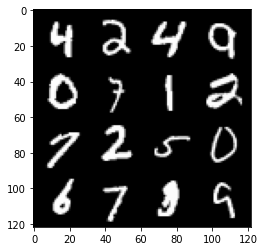

14: step 18600 / Gen loss: 7.908765573501589 / disc_loss: 0.0008738514210563153


  0%|          | 0/469 [00:00<?, ?it/s]

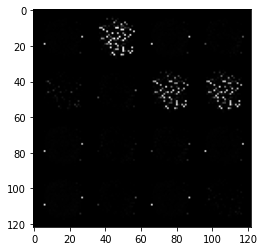

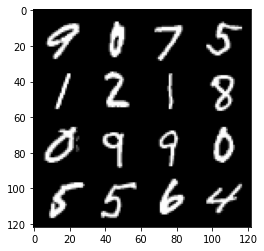

15: step 18900 / Gen loss: 8.198113241195676 / disc_loss: 0.0005214958121359813


  0%|          | 0/469 [00:00<?, ?it/s]

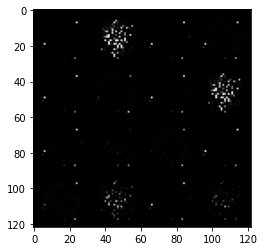

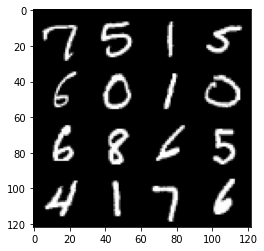

16: step 19200 / Gen loss: 7.94836422920227 / disc_loss: 0.0005941963496540359


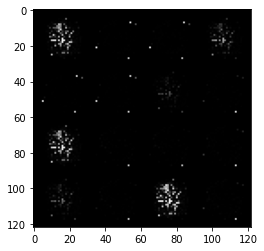

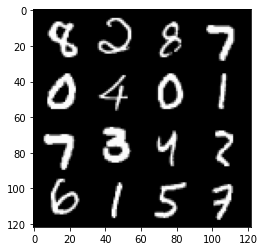

16: step 19500 / Gen loss: 8.12260886033376 / disc_loss: 0.0007336364738875999


  0%|          | 0/469 [00:00<?, ?it/s]

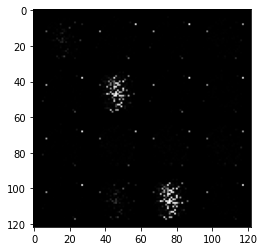

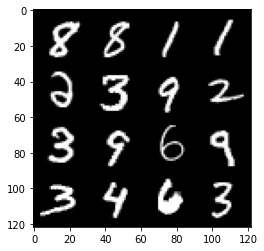

17: step 19800 / Gen loss: 8.064781982103977 / disc_loss: 0.0007357303252986946


  0%|          | 0/469 [00:00<?, ?it/s]

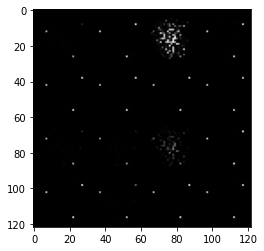

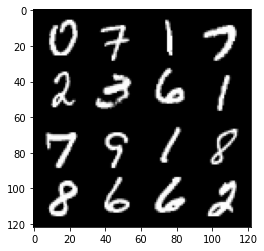

18: step 20100 / Gen loss: 7.982572115262352 / disc_loss: 0.0009312342196547743


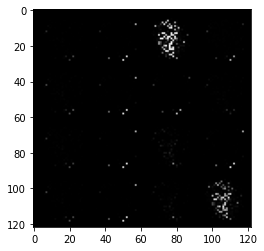

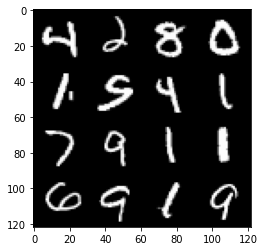

18: step 20400 / Gen loss: 8.398036522865294 / disc_loss: 0.0010279639631335163


  0%|          | 0/469 [00:00<?, ?it/s]

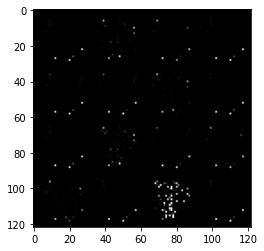

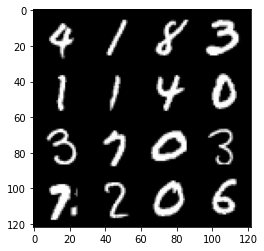

19: step 20700 / Gen loss: 8.05133180777232 / disc_loss: 0.0005473440215185598


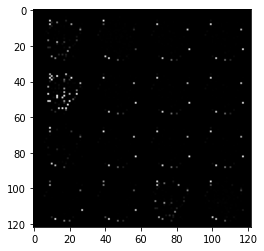

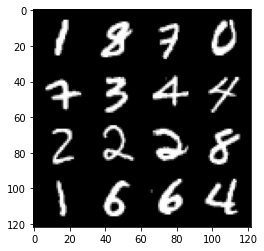

19: step 21000 / Gen loss: 8.610546862284338 / disc_loss: 0.00023623256095258217


  0%|          | 0/469 [00:00<?, ?it/s]

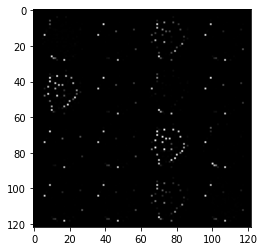

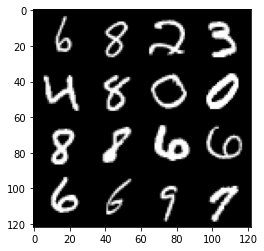

20: step 21300 / Gen loss: 8.881292181015022 / disc_loss: 0.00016453451583705214


  0%|          | 0/469 [00:00<?, ?it/s]

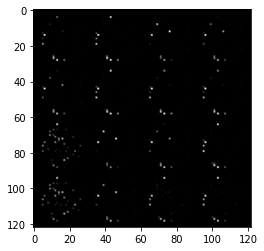

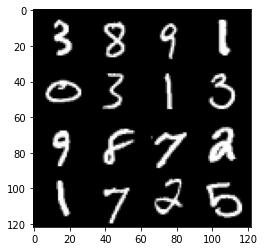

21: step 21600 / Gen loss: 8.948419450124108 / disc_loss: 0.00015311392540752407


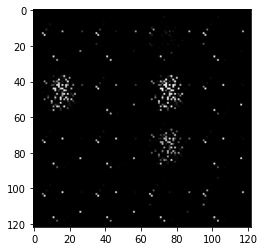

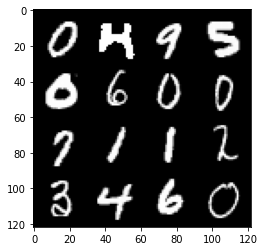

21: step 21900 / Gen loss: 9.207815186182659 / disc_loss: 0.0002742082378972553


  0%|          | 0/469 [00:00<?, ?it/s]

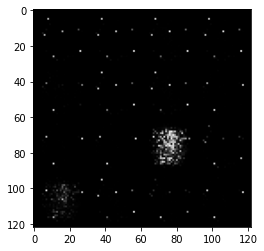

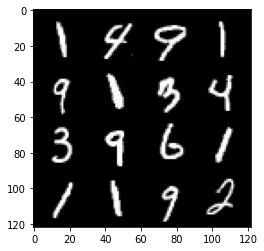

22: step 22200 / Gen loss: 10.358436403274535 / disc_loss: 0.001551665618790139


  0%|          | 0/469 [00:00<?, ?it/s]

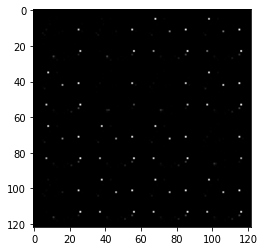

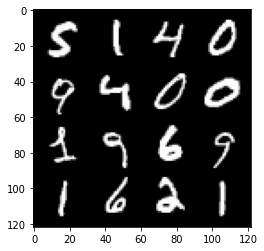

23: step 22500 / Gen loss: 9.095869725545253 / disc_loss: 0.0013883140331502864


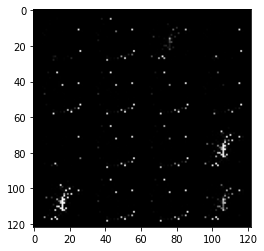

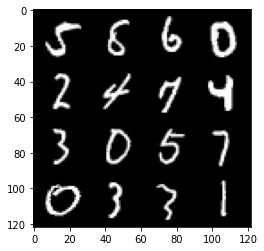

23: step 22800 / Gen loss: 8.57395969390869 / disc_loss: 0.0007180187732834983


  0%|          | 0/469 [00:00<?, ?it/s]

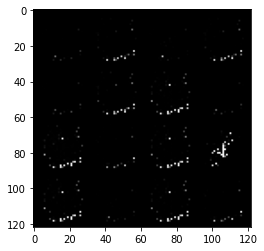

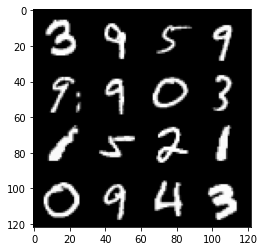

24: step 23100 / Gen loss: 8.467962147394807 / disc_loss: 0.0002911832600754375


  0%|          | 0/469 [00:00<?, ?it/s]

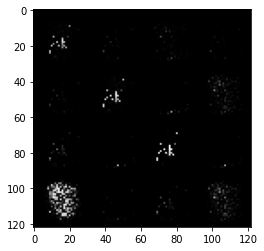

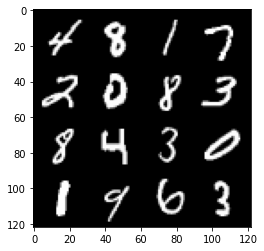

25: step 23400 / Gen loss: 9.637428824106854 / disc_loss: 0.0011411450197920203


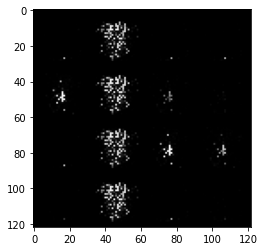

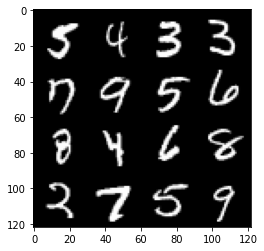

25: step 23700 / Gen loss: 8.596422220865884 / disc_loss: 0.0013315144600346675


  0%|          | 0/469 [00:00<?, ?it/s]

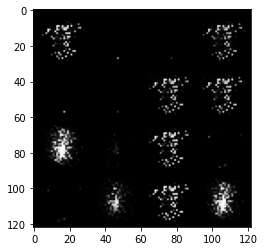

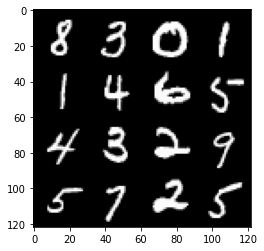

26: step 24000 / Gen loss: 8.746978316307063 / disc_loss: 0.0023623959259324078


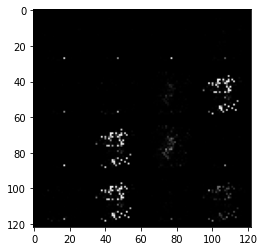

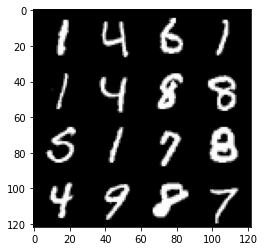

26: step 24300 / Gen loss: 8.623203577995296 / disc_loss: 0.0033240468550745053


  0%|          | 0/469 [00:00<?, ?it/s]

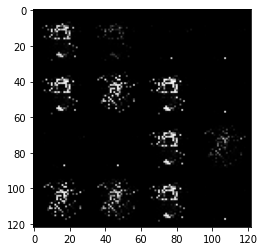

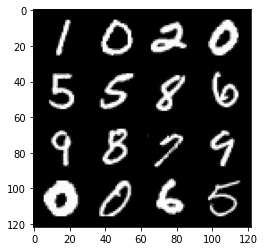

27: step 24600 / Gen loss: 8.510304255485536 / disc_loss: 0.001656871731199013


  0%|          | 0/469 [00:00<?, ?it/s]

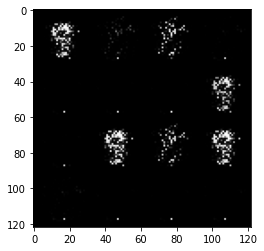

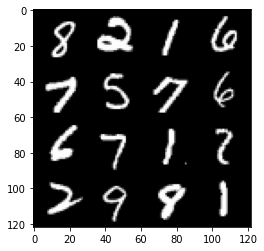

28: step 24900 / Gen loss: 8.621341392199193 / disc_loss: 0.0015449474627772968


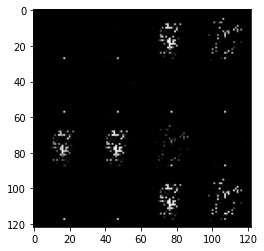

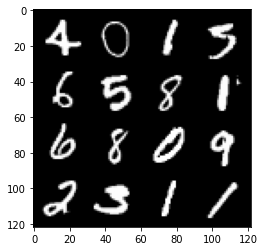

28: step 25200 / Gen loss: 8.544941945075994 / disc_loss: 0.0015998228197471086


  0%|          | 0/469 [00:00<?, ?it/s]

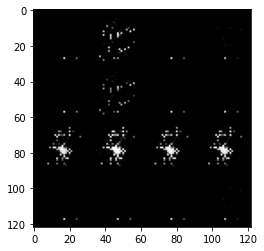

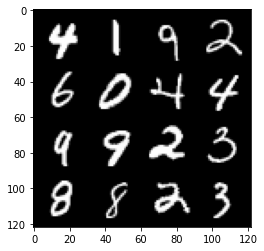

29: step 25500 / Gen loss: 8.72054445266724 / disc_loss: 0.000904346586467


  0%|          | 0/469 [00:00<?, ?it/s]

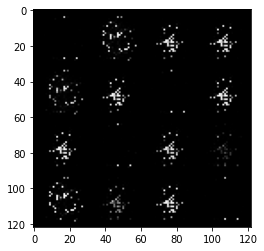

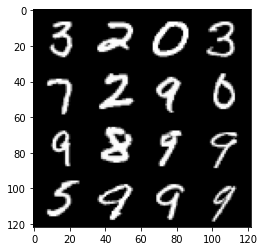

30: step 25800 / Gen loss: 8.78703123251597 / disc_loss: 0.0009239956890814944


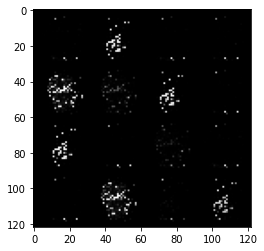

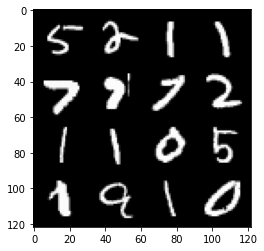

30: step 26100 / Gen loss: 9.251020679473875 / disc_loss: 0.0007964498147581857


  0%|          | 0/469 [00:00<?, ?it/s]

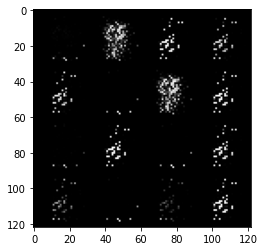

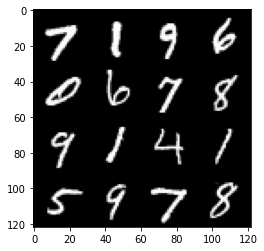

31: step 26400 / Gen loss: 9.886020498275757 / disc_loss: 0.0014964142667668056


  0%|          | 0/469 [00:00<?, ?it/s]

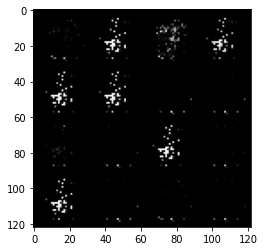

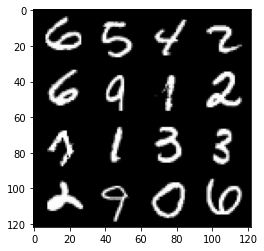

32: step 26700 / Gen loss: 9.989263302485146 / disc_loss: 0.0012314413770703446


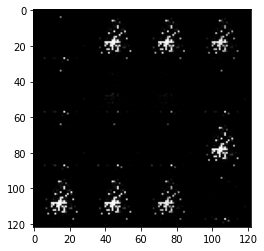

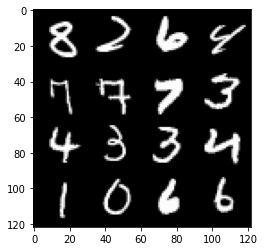

32: step 27000 / Gen loss: 9.722752211888627 / disc_loss: 0.0006070835871893601


  0%|          | 0/469 [00:00<?, ?it/s]

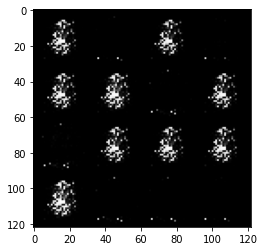

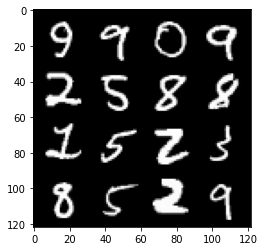

33: step 27300 / Gen loss: 9.607849035263065 / disc_loss: 0.0011035368756953778


  0%|          | 0/469 [00:00<?, ?it/s]

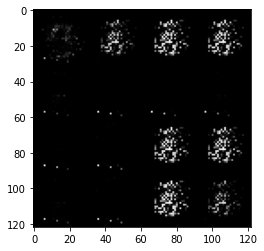

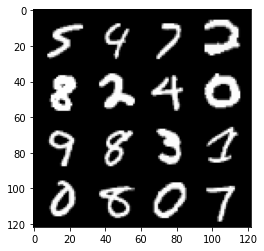

34: step 27600 / Gen loss: 9.744472548166911 / disc_loss: 0.001543089121308489


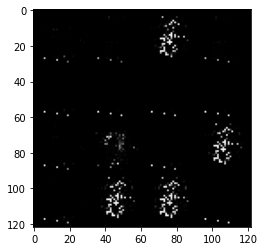

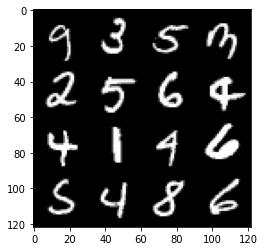

34: step 27900 / Gen loss: 9.66265183448791 / disc_loss: 0.0011938795959334436


  0%|          | 0/469 [00:00<?, ?it/s]

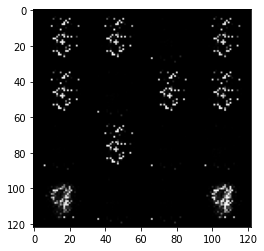

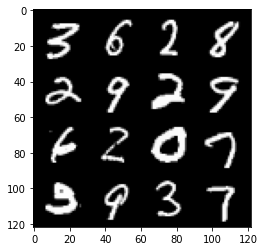

35: step 28200 / Gen loss: 10.151474494934083 / disc_loss: 0.0007425591105250833


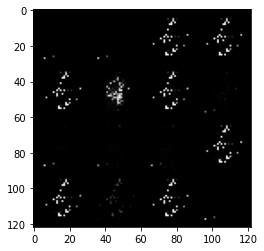

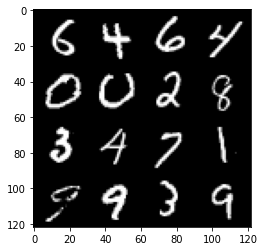

35: step 28500 / Gen loss: 10.01864846865336 / disc_loss: 0.0007429003101666849


  0%|          | 0/469 [00:00<?, ?it/s]

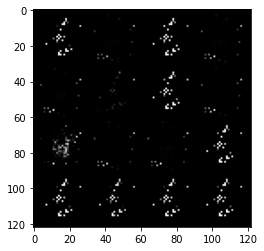

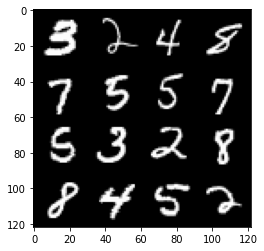

36: step 28800 / Gen loss: 9.975684200922649 / disc_loss: 0.0005569547291937251


  0%|          | 0/469 [00:00<?, ?it/s]

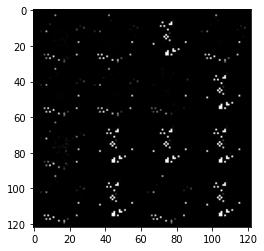

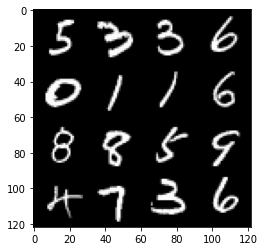

37: step 29100 / Gen loss: 9.826827192306508 / disc_loss: 0.0004900149159038846


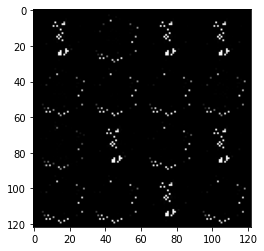

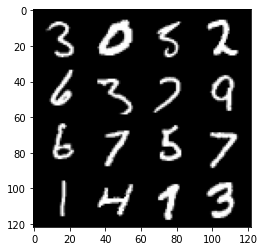

37: step 29400 / Gen loss: 9.830719013214114 / disc_loss: 0.0004132282692444279


  0%|          | 0/469 [00:00<?, ?it/s]

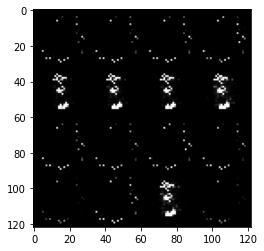

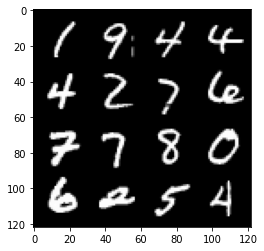

38: step 29700 / Gen loss: 10.524625565210977 / disc_loss: 0.0004493998843827285


  0%|          | 0/469 [00:00<?, ?it/s]

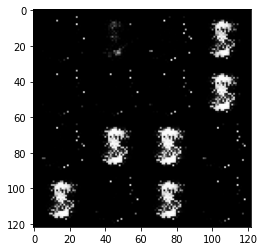

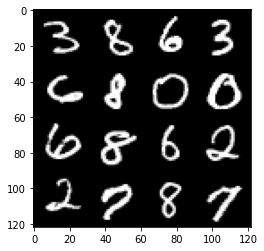

39: step 30000 / Gen loss: 11.6802549235026 / disc_loss: 0.0018124222687129076


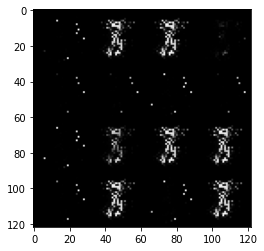

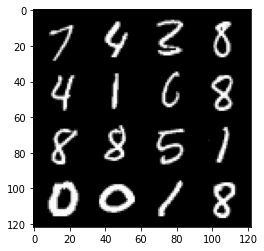

39: step 30300 / Gen loss: 9.359302237828572 / disc_loss: 0.002096968018862149


  0%|          | 0/469 [00:00<?, ?it/s]

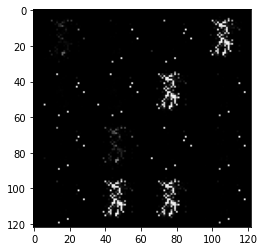

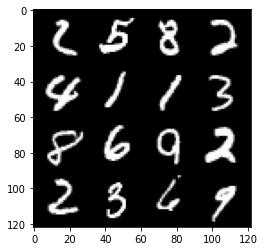

40: step 30600 / Gen loss: 8.975696023305256 / disc_loss: 0.000644228972632846


  0%|          | 0/469 [00:00<?, ?it/s]

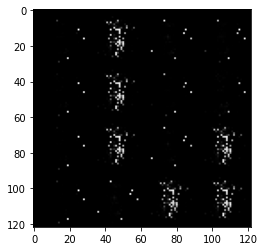

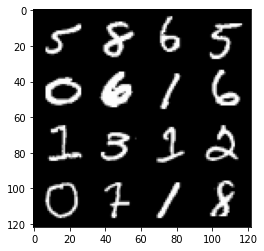

41: step 30900 / Gen loss: 9.414950777689617 / disc_loss: 0.0006547971002388903


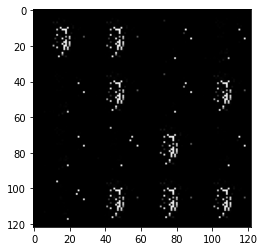

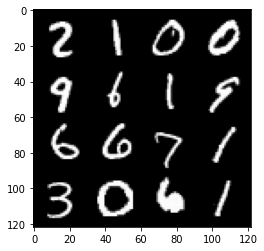

41: step 31200 / Gen loss: 9.715826673507687 / disc_loss: 0.00028833146264029604


  0%|          | 0/469 [00:00<?, ?it/s]

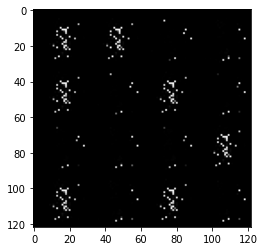

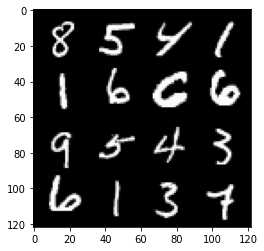

42: step 31500 / Gen loss: 9.749252812067672 / disc_loss: 0.0001708046060715182


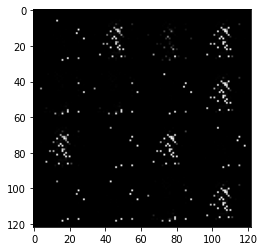

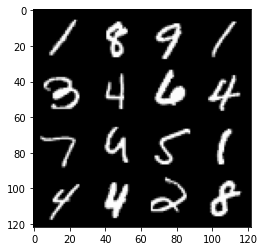

42: step 31800 / Gen loss: 9.857445300420123 / disc_loss: 0.00011477385599088544


  0%|          | 0/469 [00:00<?, ?it/s]

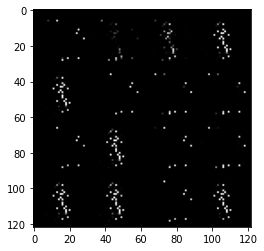

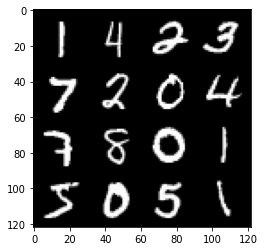

43: step 32100 / Gen loss: 10.205782397588104 / disc_loss: 0.00011848380025185179


  0%|          | 0/469 [00:00<?, ?it/s]

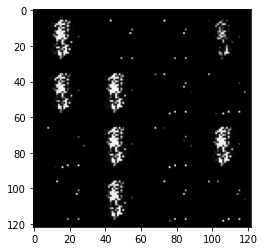

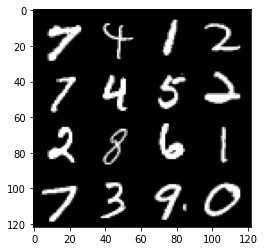

44: step 32400 / Gen loss: 10.398620376586912 / disc_loss: 0.0006217114074752317


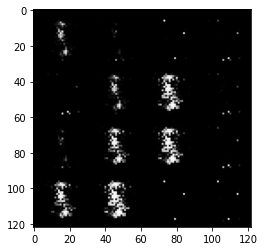

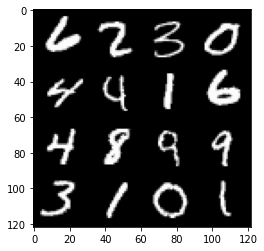

44: step 32700 / Gen loss: 10.0832382329305 / disc_loss: 0.0014949830820235848


  0%|          | 0/469 [00:00<?, ?it/s]

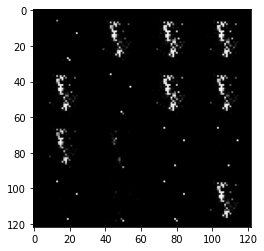

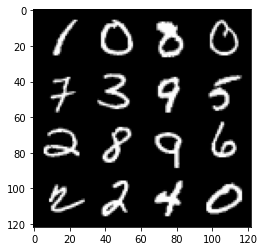

45: step 33000 / Gen loss: 9.613642819722491 / disc_loss: 0.0009019170194490771


  0%|          | 0/469 [00:00<?, ?it/s]

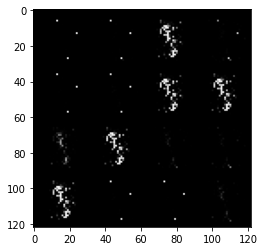

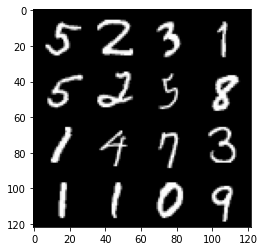

46: step 33300 / Gen loss: 9.9351899433136 / disc_loss: 0.0005900171851074751


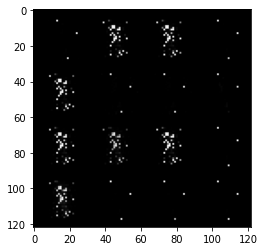

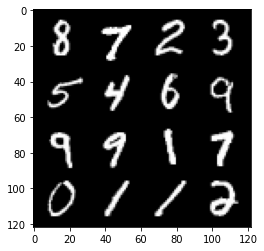

46: step 33600 / Gen loss: 9.701280981699622 / disc_loss: 0.0004285247042571427


  0%|          | 0/469 [00:00<?, ?it/s]

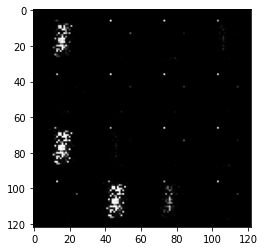

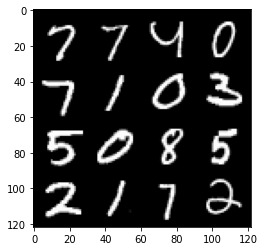

47: step 33900 / Gen loss: 10.3351415348053 / disc_loss: 0.000558668845636324


  0%|          | 0/469 [00:00<?, ?it/s]

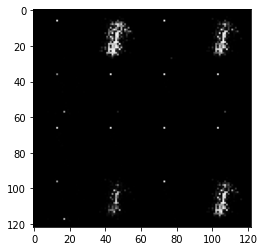

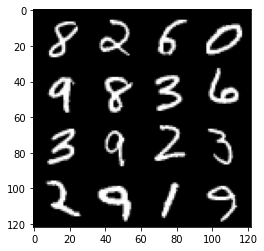

48: step 34200 / Gen loss: 9.892543913523365 / disc_loss: 0.0018525350279621005


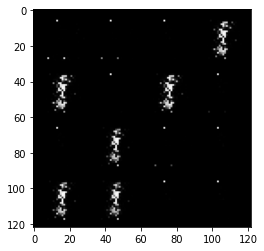

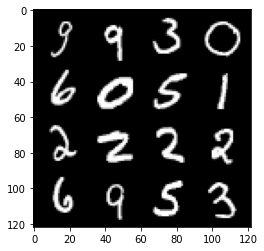

48: step 34500 / Gen loss: 9.346508576075234 / disc_loss: 0.001669844846631653


  0%|          | 0/469 [00:00<?, ?it/s]

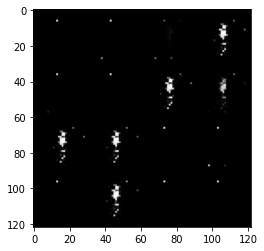

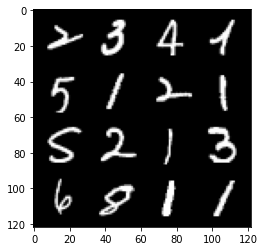

49: step 34800 / Gen loss: 9.672592134475714 / disc_loss: 0.0009454749869170579


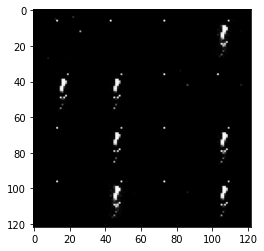

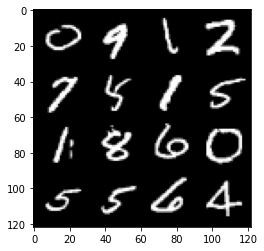

49: step 35100 / Gen loss: 9.618099374771113 / disc_loss: 0.0008351333617368558


  0%|          | 0/469 [00:00<?, ?it/s]

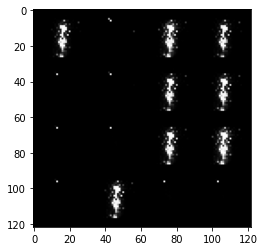

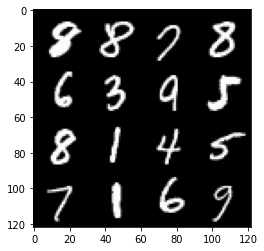

50: step 35400 / Gen loss: 9.928274615605677 / disc_loss: 0.0012714309357397728


  0%|          | 0/469 [00:00<?, ?it/s]

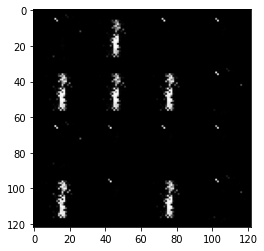

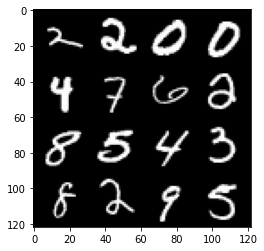

51: step 35700 / Gen loss: 9.478196503321334 / disc_loss: 0.002649875857823646


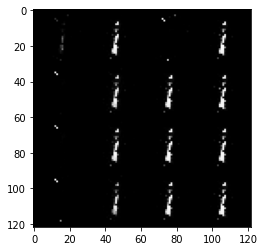

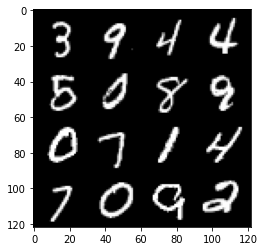

51: step 36000 / Gen loss: 9.462907269795743 / disc_loss: 0.001737636856172078


  0%|          | 0/469 [00:00<?, ?it/s]

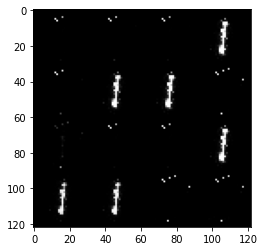

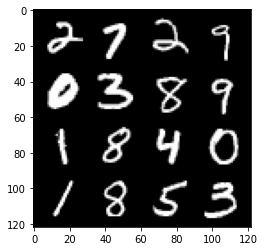

52: step 36300 / Gen loss: 9.714575926462816 / disc_loss: 0.001766846119329179


  0%|          | 0/469 [00:00<?, ?it/s]

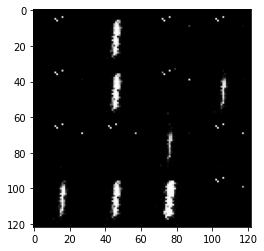

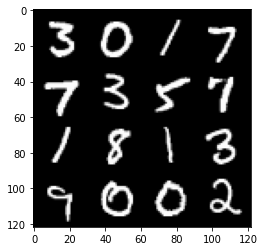

53: step 36600 / Gen loss: 9.42839518547058 / disc_loss: 0.005538356032338923


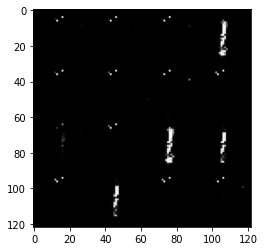

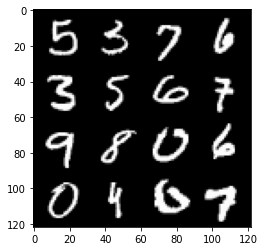

53: step 36900 / Gen loss: 9.304767112731923 / disc_loss: 0.010246346364244045


  0%|          | 0/469 [00:00<?, ?it/s]

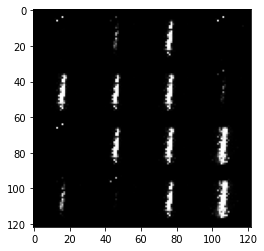

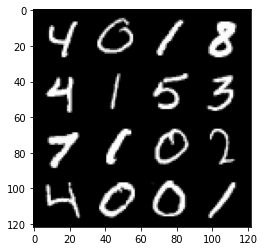

54: step 37200 / Gen loss: 9.150078516006472 / disc_loss: 0.007643671655484164


  0%|          | 0/469 [00:00<?, ?it/s]

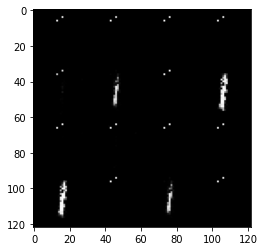

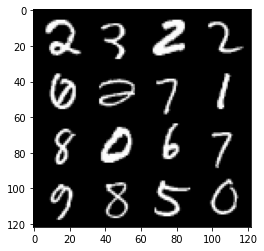

55: step 37500 / Gen loss: 9.009405012130735 / disc_loss: 0.006915390062495131


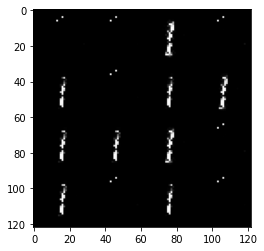

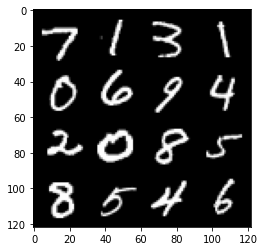

55: step 37800 / Gen loss: 9.520996503829956 / disc_loss: 0.00347675502707716


  0%|          | 0/469 [00:00<?, ?it/s]

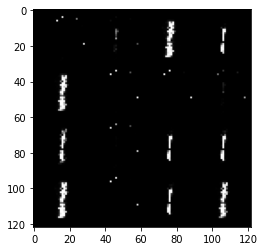

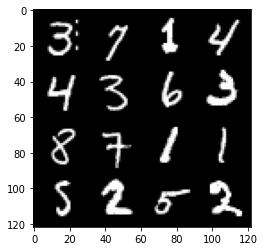

56: step 38100 / Gen loss: 9.47133106549581 / disc_loss: 0.004300368657374444


  0%|          | 0/469 [00:00<?, ?it/s]

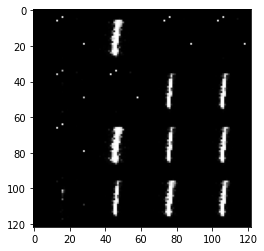

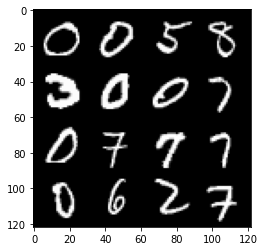

57: step 38400 / Gen loss: 9.27359894434611 / disc_loss: 0.010009965356730396


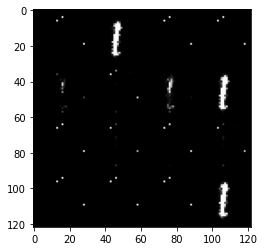

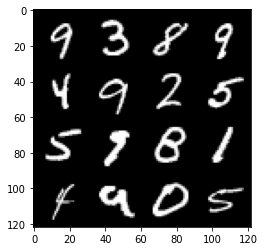

57: step 38700 / Gen loss: 9.045788990656536 / disc_loss: 0.01154741406537748


  0%|          | 0/469 [00:00<?, ?it/s]

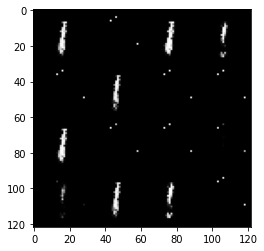

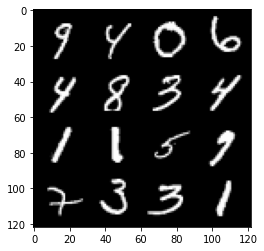

58: step 39000 / Gen loss: 9.09426846504211 / disc_loss: 0.010340673864508666


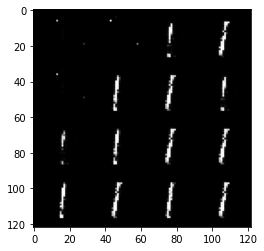

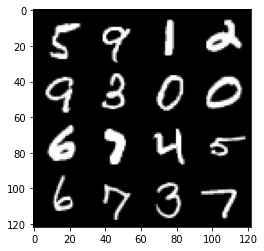

58: step 39300 / Gen loss: 9.063809321721394 / disc_loss: 0.00625330768011433


  0%|          | 0/469 [00:00<?, ?it/s]

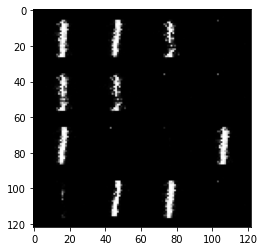

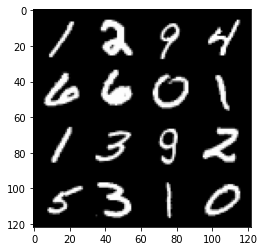

59: step 39600 / Gen loss: 8.629193290074664 / disc_loss: 0.017421365161232348


  0%|          | 0/469 [00:00<?, ?it/s]

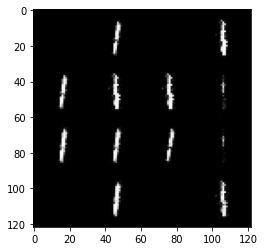

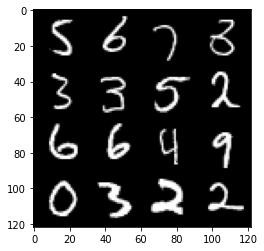

60: step 39900 / Gen loss: 7.628486809730526 / disc_loss: 0.02585626961624562


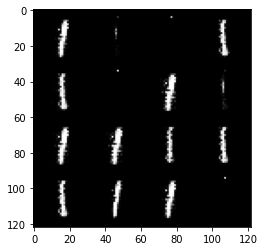

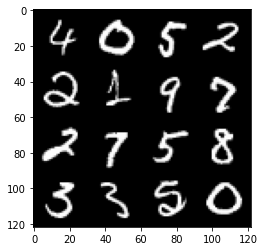

60: step 40200 / Gen loss: 7.212175537745157 / disc_loss: 0.0418453210623314


  0%|          | 0/469 [00:00<?, ?it/s]

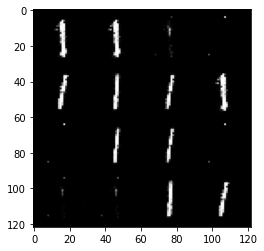

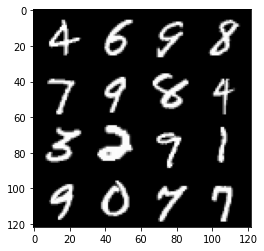

61: step 40500 / Gen loss: 7.073087751070657 / disc_loss: 0.03125675549808267


  0%|          | 0/469 [00:00<?, ?it/s]

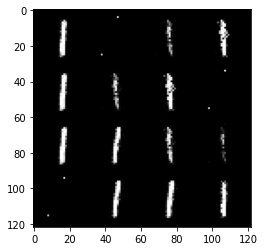

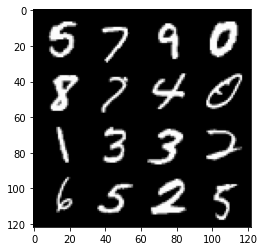

62: step 40800 / Gen loss: 6.828922359148659 / disc_loss: 0.0402228819353817


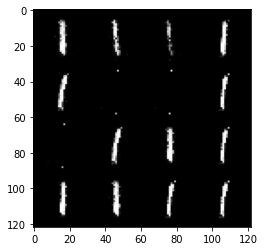

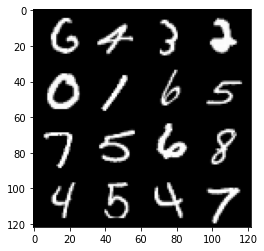

62: step 41100 / Gen loss: 6.660978929201763 / disc_loss: 0.03555420167744158


  0%|          | 0/469 [00:00<?, ?it/s]

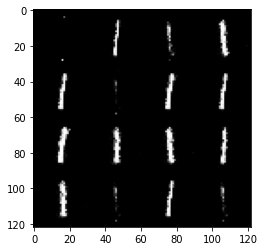

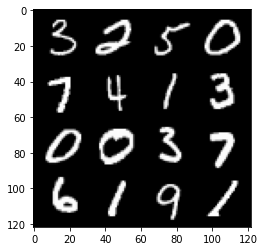

63: step 41400 / Gen loss: 6.234281697273249 / disc_loss: 0.04386318868181356


  0%|          | 0/469 [00:00<?, ?it/s]

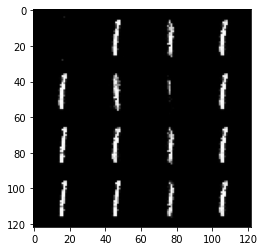

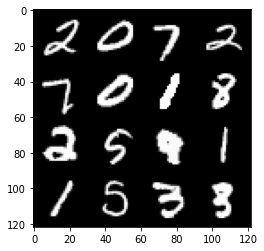

64: step 41700 / Gen loss: 6.149230868021642 / disc_loss: 0.04800942089874293


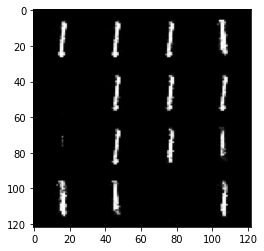

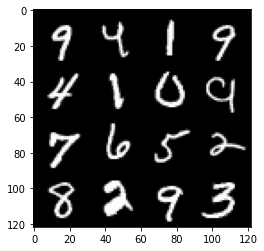

64: step 42000 / Gen loss: 6.0254995218912795 / disc_loss: 0.04788453751398866


  0%|          | 0/469 [00:00<?, ?it/s]

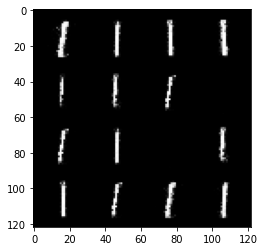

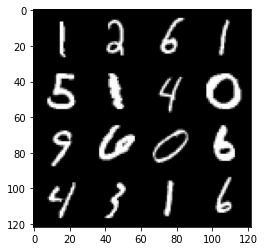

65: step 42300 / Gen loss: 5.6727075990041085 / disc_loss: 0.054684003453391285


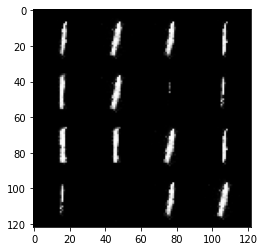

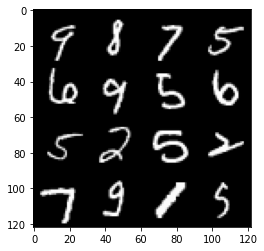

65: step 42600 / Gen loss: 5.413132750193278 / disc_loss: 0.07140831336223828


  0%|          | 0/469 [00:00<?, ?it/s]

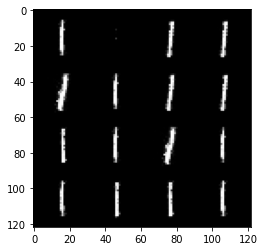

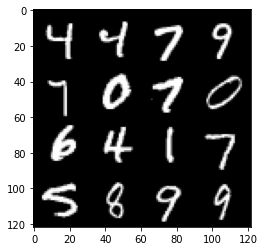

66: step 42900 / Gen loss: 5.111013094584148 / disc_loss: 0.05373490558626753


  0%|          | 0/469 [00:00<?, ?it/s]

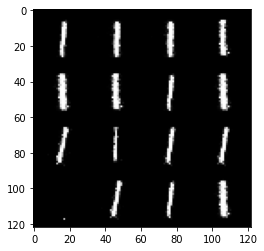

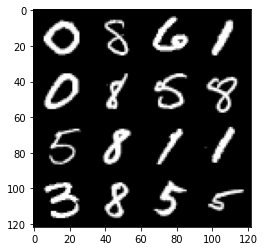

67: step 43200 / Gen loss: 5.2027052338918045 / disc_loss: 0.05932003290082018


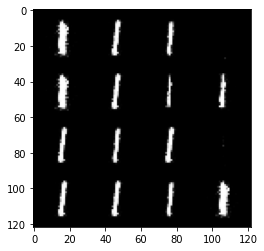

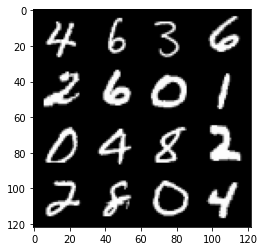

67: step 43500 / Gen loss: 5.212196111679084 / disc_loss: 0.06227029047285522


  0%|          | 0/469 [00:00<?, ?it/s]

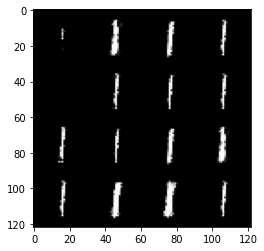

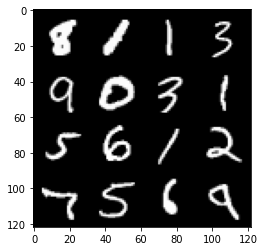

68: step 43800 / Gen loss: 5.138530201911922 / disc_loss: 0.05316046833992005


  0%|          | 0/469 [00:00<?, ?it/s]

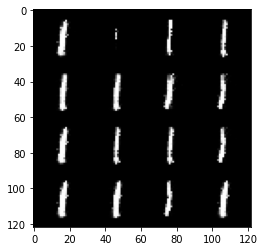

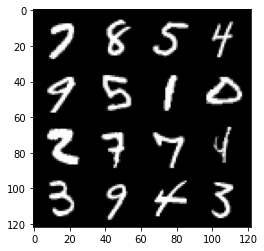

69: step 44100 / Gen loss: 5.089185951550801 / disc_loss: 0.041550323083065485


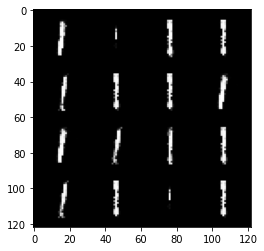

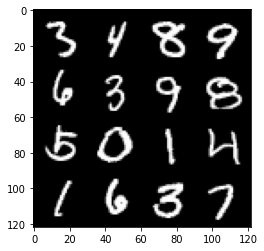

69: step 44400 / Gen loss: 4.87910797437032 / disc_loss: 0.05398150523193184


  0%|          | 0/469 [00:00<?, ?it/s]

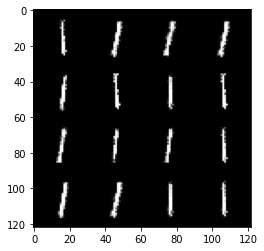

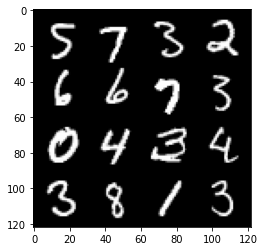

70: step 44700 / Gen loss: 4.627753351529438 / disc_loss: 0.05106764838875585


  0%|          | 0/469 [00:00<?, ?it/s]

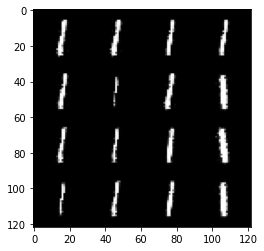

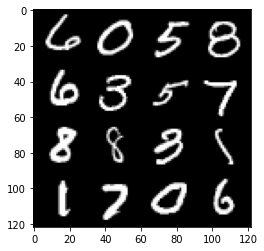

71: step 45000 / Gen loss: 4.988614181677499 / disc_loss: 0.06525114505396537


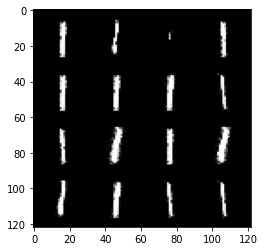

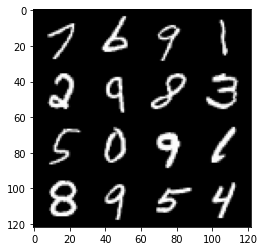

71: step 45300 / Gen loss: 4.777661706606541 / disc_loss: 0.07848015247844163


  0%|          | 0/469 [00:00<?, ?it/s]

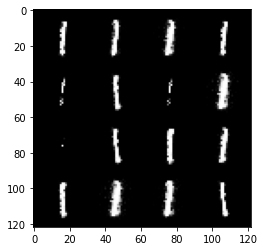

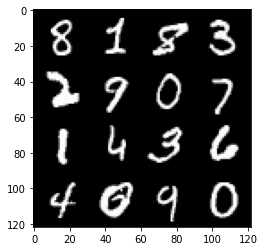

72: step 45600 / Gen loss: 4.501836744944251 / disc_loss: 0.06682502846854428


  0%|          | 0/469 [00:00<?, ?it/s]

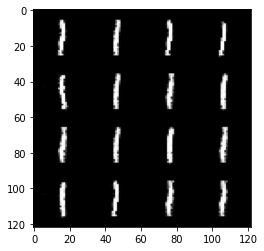

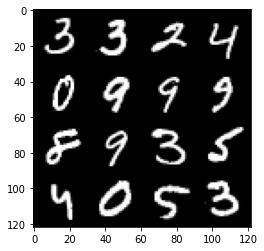

73: step 45900 / Gen loss: 4.510408993562064 / disc_loss: 0.052683658284756074


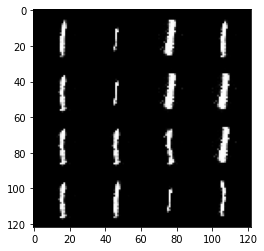

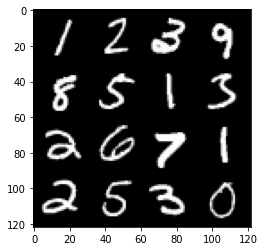

73: step 46200 / Gen loss: 4.505842935244244 / disc_loss: 0.05800530482859661


  0%|          | 0/469 [00:00<?, ?it/s]

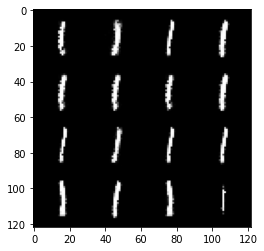

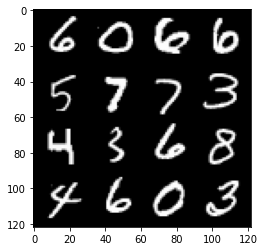

74: step 46500 / Gen loss: 4.700827501614891 / disc_loss: 0.06550061724614353


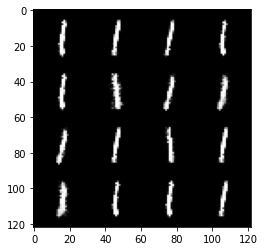

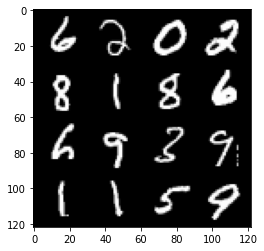

74: step 46800 / Gen loss: 4.313866674105327 / disc_loss: 0.08084246315993364


  0%|          | 0/469 [00:00<?, ?it/s]

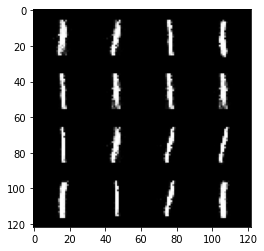

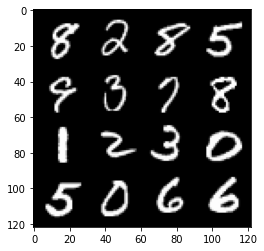

75: step 47100 / Gen loss: 4.334355528354647 / disc_loss: 0.06957405990300077


  0%|          | 0/469 [00:00<?, ?it/s]

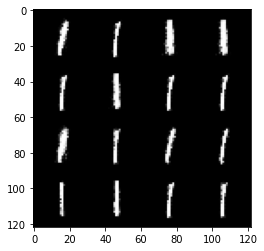

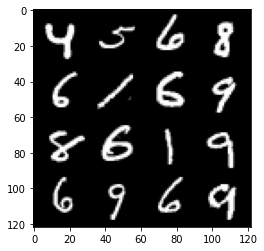

76: step 47400 / Gen loss: 4.108929766019187 / disc_loss: 0.09190668678066388


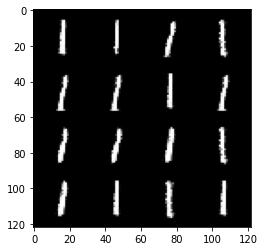

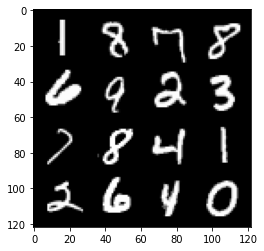

76: step 47700 / Gen loss: 4.211065669059754 / disc_loss: 0.07193001238939663


  0%|          | 0/469 [00:00<?, ?it/s]

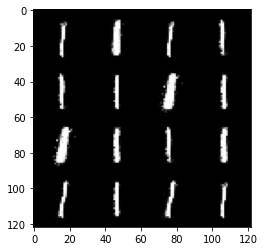

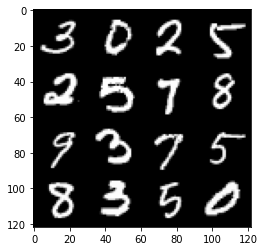

77: step 48000 / Gen loss: 4.127188450495405 / disc_loss: 0.09398795203305778


  0%|          | 0/469 [00:00<?, ?it/s]

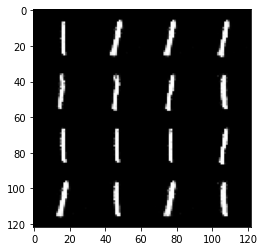

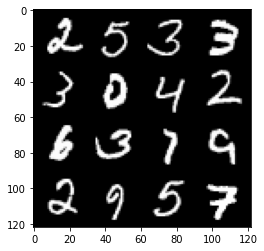

78: step 48300 / Gen loss: 4.249067747592924 / disc_loss: 0.07063353189577659


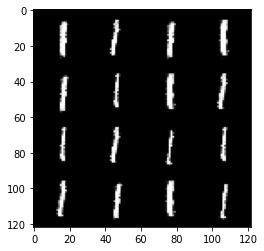

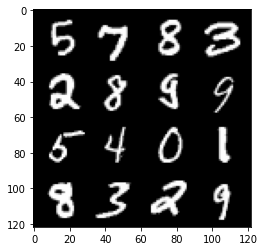

78: step 48600 / Gen loss: 4.3249370725949605 / disc_loss: 0.08418346195481717


  0%|          | 0/469 [00:00<?, ?it/s]

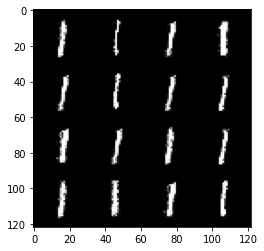

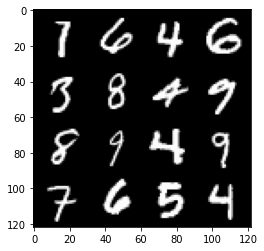

79: step 48900 / Gen loss: 4.21887947400411 / disc_loss: 0.07287846022285525


  0%|          | 0/469 [00:00<?, ?it/s]

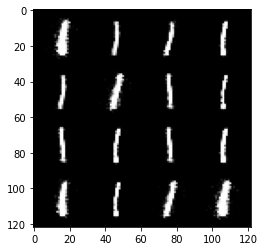

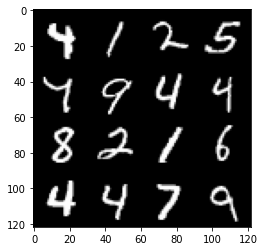

80: step 49200 / Gen loss: 4.342719318072003 / disc_loss: 0.07293010382913054


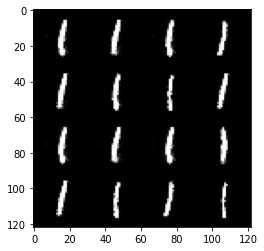

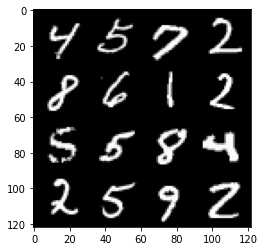

80: step 49500 / Gen loss: 4.059796475569405 / disc_loss: 0.09707610996440048


  0%|          | 0/469 [00:00<?, ?it/s]

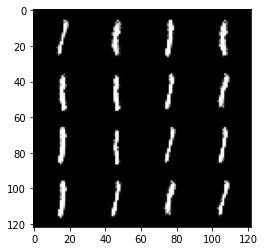

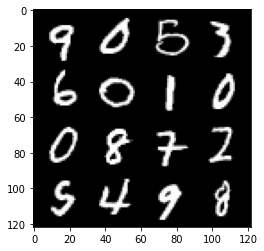

81: step 49800 / Gen loss: 4.102991108099619 / disc_loss: 0.09388181371924785


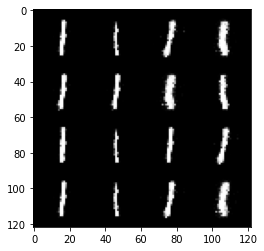

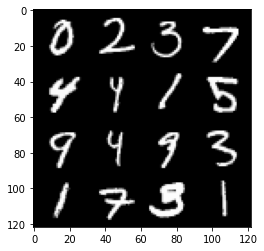

81: step 50100 / Gen loss: 4.094837081432343 / disc_loss: 0.0668098947312683


  0%|          | 0/469 [00:00<?, ?it/s]

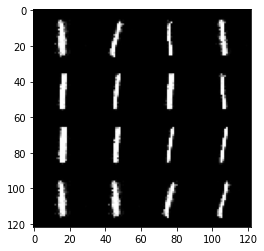

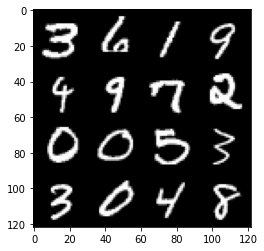

82: step 50400 / Gen loss: 4.028073945840201 / disc_loss: 0.0835856443239997


  0%|          | 0/469 [00:00<?, ?it/s]

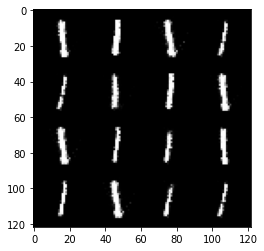

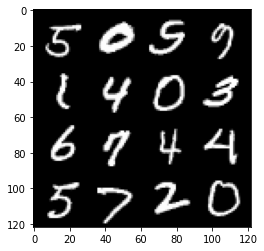

83: step 50700 / Gen loss: 4.033379536469776 / disc_loss: 0.07661527832970023


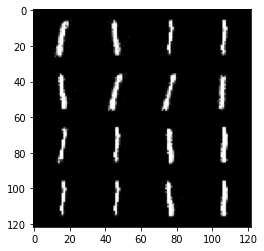

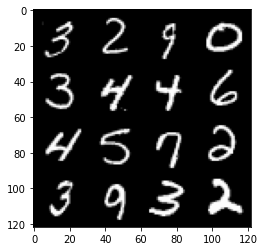

83: step 51000 / Gen loss: 4.071637895107269 / disc_loss: 0.07278539891354736


  0%|          | 0/469 [00:00<?, ?it/s]

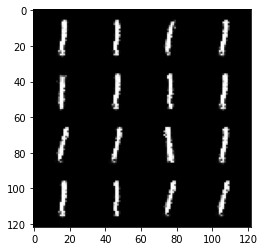

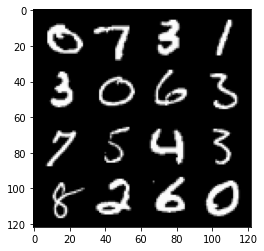

84: step 51300 / Gen loss: 3.9561037715276077 / disc_loss: 0.0774012573218594


  0%|          | 0/469 [00:00<?, ?it/s]

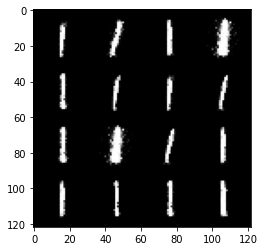

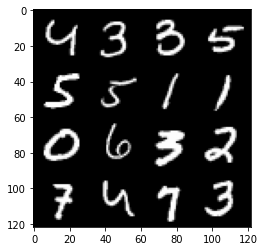

85: step 51600 / Gen loss: 4.103664805094403 / disc_loss: 0.07571181638787187


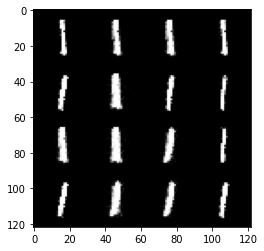

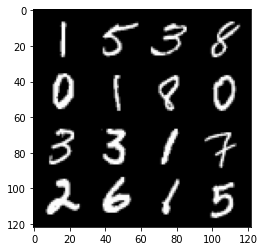

85: step 51900 / Gen loss: 4.072724307378134 / disc_loss: 0.06459083929037059


  0%|          | 0/469 [00:00<?, ?it/s]

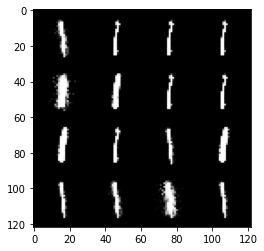

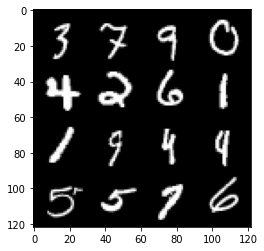

86: step 52200 / Gen loss: 4.084024388790131 / disc_loss: 0.07125174728532635


  0%|          | 0/469 [00:00<?, ?it/s]

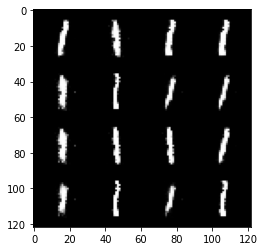

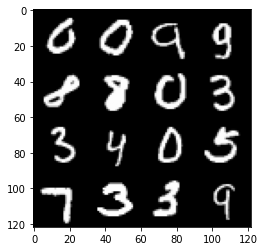

87: step 52500 / Gen loss: 4.329172836144763 / disc_loss: 0.05048673323666059


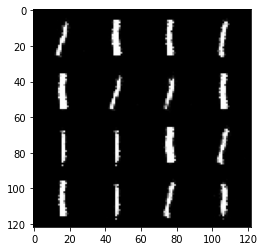

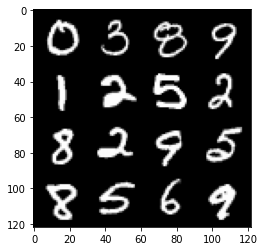

87: step 52800 / Gen loss: 4.179657941659292 / disc_loss: 0.07270863052147129


  0%|          | 0/469 [00:00<?, ?it/s]

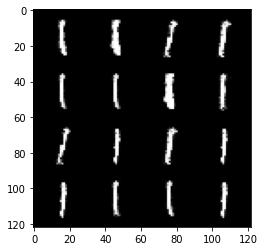

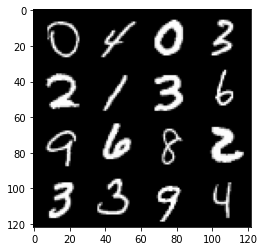

88: step 53100 / Gen loss: 3.9259318534533163 / disc_loss: 0.07711804893178244


  0%|          | 0/469 [00:00<?, ?it/s]

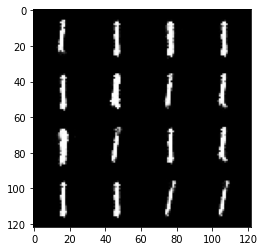

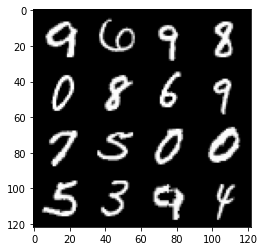

89: step 53400 / Gen loss: 3.9120564969380722 / disc_loss: 0.08218413171668842


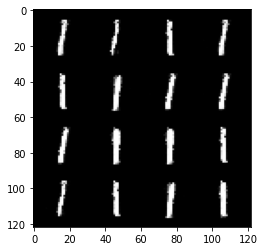

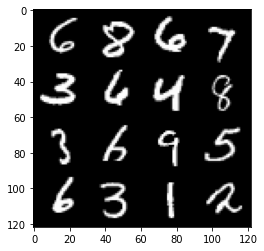

89: step 53700 / Gen loss: 3.9160220925013243 / disc_loss: 0.07848923789337277


  0%|          | 0/469 [00:00<?, ?it/s]

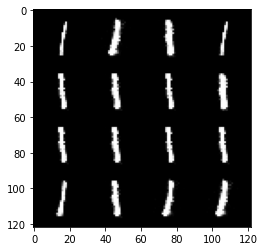

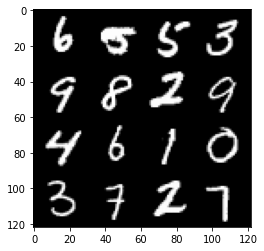

90: step 54000 / Gen loss: 3.8667084240913376 / disc_loss: 0.09175606307263169


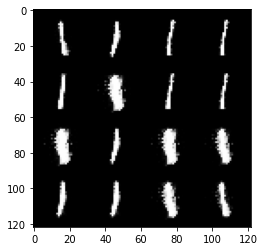

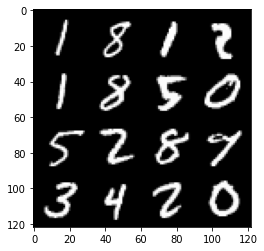

90: step 54300 / Gen loss: 4.372513554890951 / disc_loss: 0.07525642345038557


  0%|          | 0/469 [00:00<?, ?it/s]

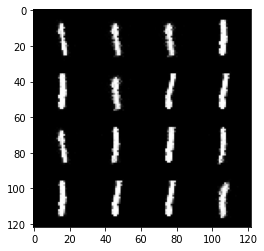

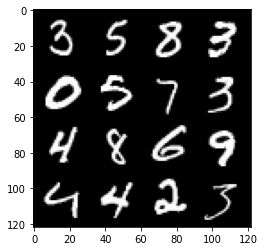

91: step 54600 / Gen loss: 4.1329355764389035 / disc_loss: 0.08093696128576992


  0%|          | 0/469 [00:00<?, ?it/s]

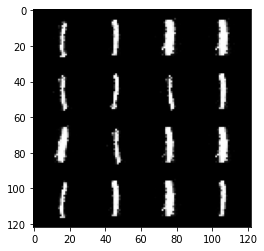

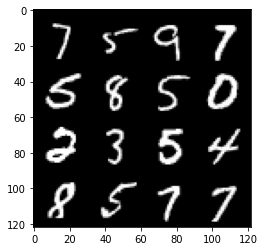

92: step 54900 / Gen loss: 4.0261075401306154 / disc_loss: 0.06664217636299631


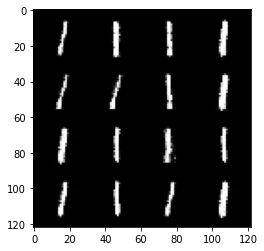

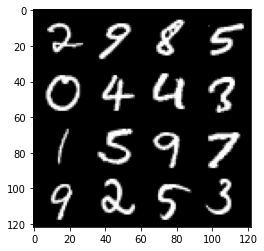

92: step 55200 / Gen loss: 3.886432549953462 / disc_loss: 0.1149003807020684


  0%|          | 0/469 [00:00<?, ?it/s]

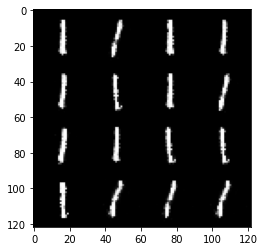

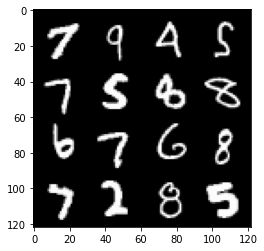

93: step 55500 / Gen loss: 3.653011901378633 / disc_loss: 0.11552854021390284


  0%|          | 0/469 [00:00<?, ?it/s]

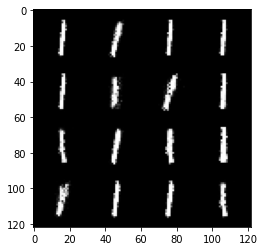

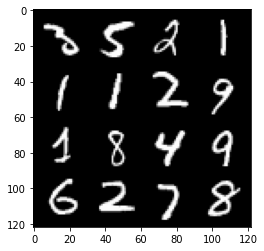

94: step 55800 / Gen loss: 3.7415906198819484 / disc_loss: 0.09957738374670351


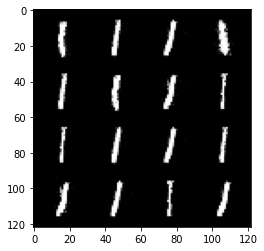

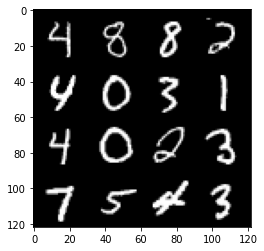

94: step 56100 / Gen loss: 3.9531028254826843 / disc_loss: 0.0800096171659728


  0%|          | 0/469 [00:00<?, ?it/s]

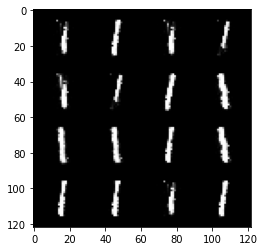

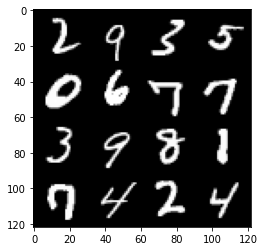

95: step 56400 / Gen loss: 3.8351872078577696 / disc_loss: 0.08251084746172029


  0%|          | 0/469 [00:00<?, ?it/s]

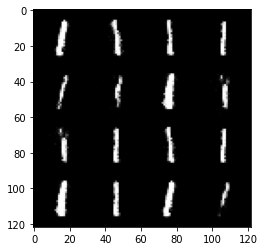

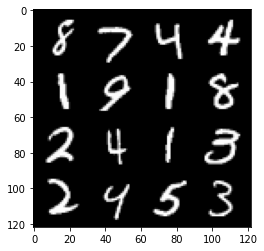

96: step 56700 / Gen loss: 4.015195596218107 / disc_loss: 0.07655825843413676


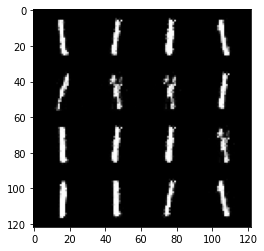

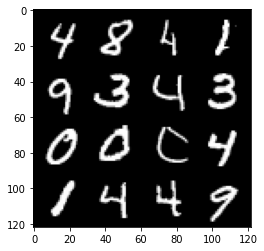

96: step 57000 / Gen loss: 3.810133083661397 / disc_loss: 0.09643821663533653


  0%|          | 0/469 [00:00<?, ?it/s]

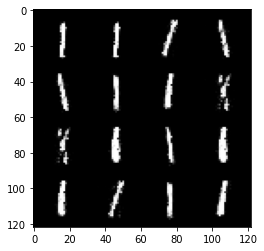

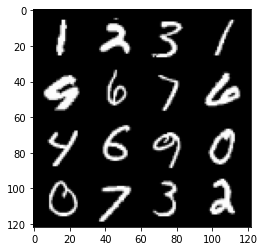

97: step 57300 / Gen loss: 4.019956835110983 / disc_loss: 0.08783239639053747


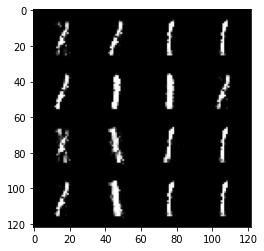

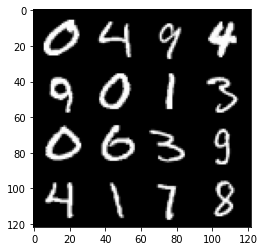

97: step 57600 / Gen loss: 3.771243460178374 / disc_loss: 0.09911922267948577


  0%|          | 0/469 [00:00<?, ?it/s]

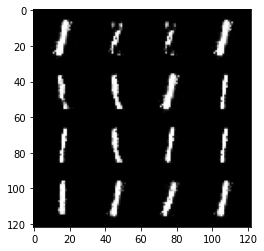

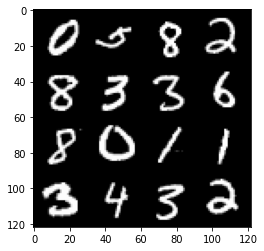

98: step 57900 / Gen loss: 3.84178512096405 / disc_loss: 0.07471063734342649


  0%|          | 0/469 [00:00<?, ?it/s]

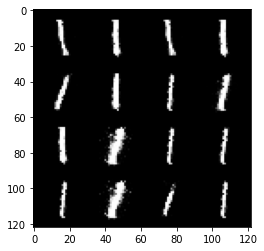

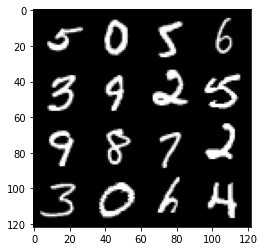

99: step 58200 / Gen loss: 4.0792256251970915 / disc_loss: 0.08284322839851188


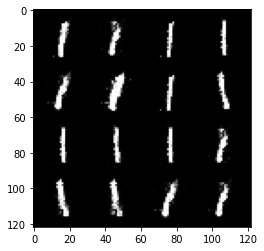

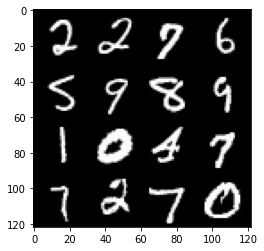

99: step 58500 / Gen loss: 3.9603778823216755 / disc_loss: 0.07105784869442383


  0%|          | 0/469 [00:00<?, ?it/s]

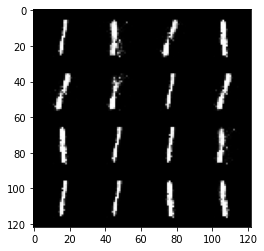

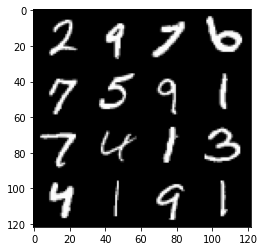

100: step 58800 / Gen loss: 3.9395806471506734 / disc_loss: 0.08545026033495859


  0%|          | 0/469 [00:00<?, ?it/s]

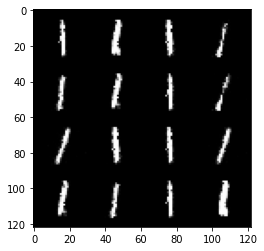

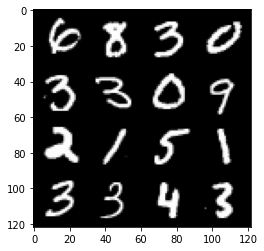

101: step 59100 / Gen loss: 3.756750378608706 / disc_loss: 0.08034898157231508


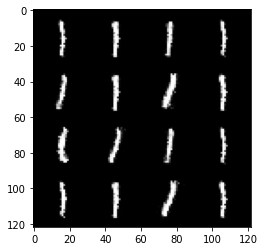

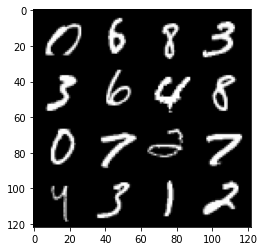

101: step 59400 / Gen loss: 3.5946331087748185 / disc_loss: 0.1126491722092032


  0%|          | 0/469 [00:00<?, ?it/s]

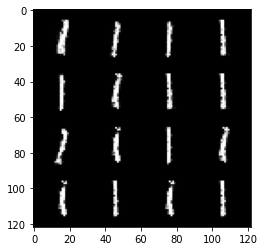

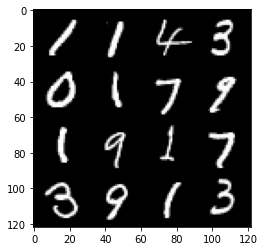

102: step 59700 / Gen loss: 3.6365244976679487 / disc_loss: 0.10798665296286342


  0%|          | 0/469 [00:00<?, ?it/s]

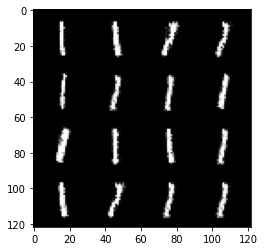

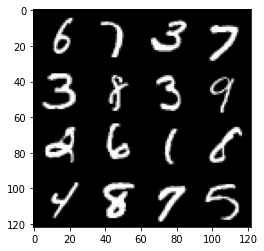

103: step 60000 / Gen loss: 3.798763149579365 / disc_loss: 0.07613001774996522


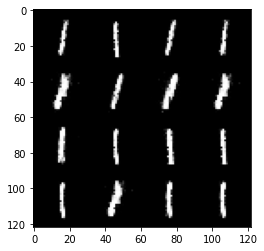

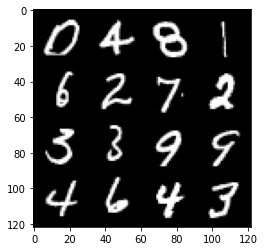

103: step 60300 / Gen loss: 3.7281530507405596 / disc_loss: 0.0947016484259317


  0%|          | 0/469 [00:00<?, ?it/s]

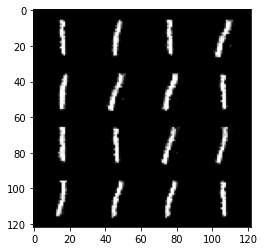

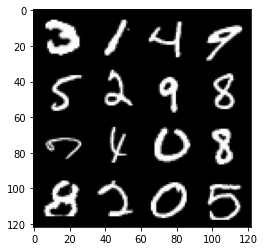

104: step 60600 / Gen loss: 3.6203574252128594 / disc_loss: 0.10209117084741585


  0%|          | 0/469 [00:00<?, ?it/s]

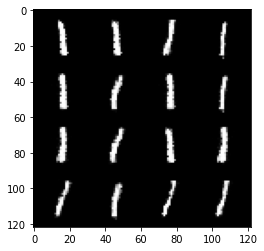

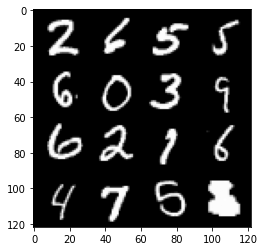

105: step 60900 / Gen loss: 3.391527823607128 / disc_loss: 0.11930158664782829


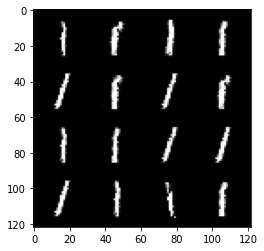

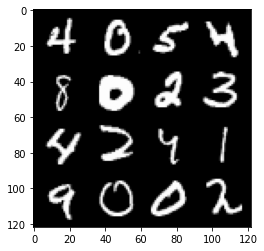

105: step 61200 / Gen loss: 3.543398659229277 / disc_loss: 0.11746428350607552


  0%|          | 0/469 [00:00<?, ?it/s]

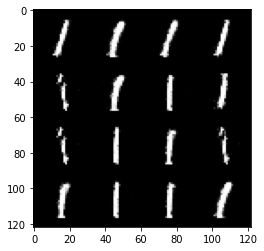

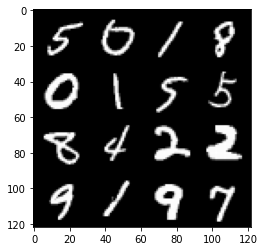

106: step 61500 / Gen loss: 3.6894966618219978 / disc_loss: 0.10980856228619822


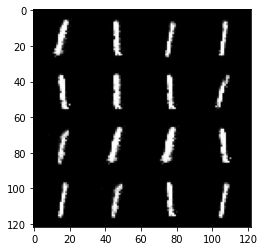

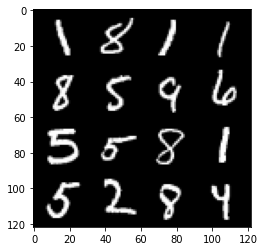

106: step 61800 / Gen loss: 3.783899689515433 / disc_loss: 0.0934705518372357


  0%|          | 0/469 [00:00<?, ?it/s]

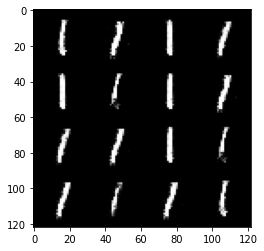

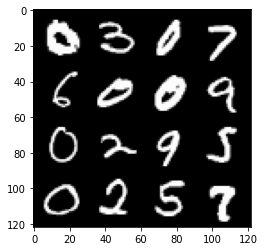

107: step 62100 / Gen loss: 3.7586578647295643 / disc_loss: 0.10271684357275557


  0%|          | 0/469 [00:00<?, ?it/s]

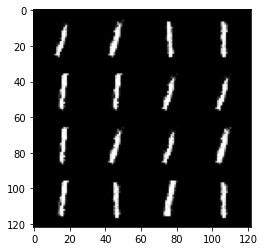

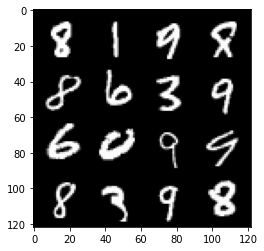

108: step 62400 / Gen loss: 3.874628105163573 / disc_loss: 0.09072979020575682


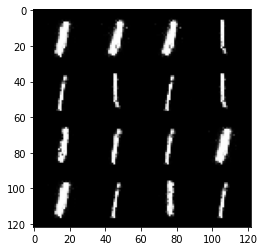

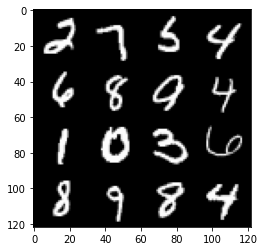

108: step 62700 / Gen loss: 3.572504758834837 / disc_loss: 0.1110293551161885


  0%|          | 0/469 [00:00<?, ?it/s]

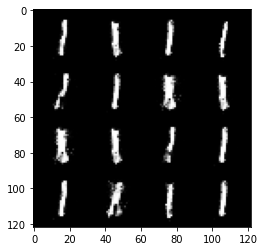

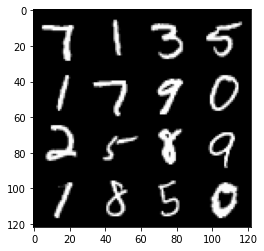

109: step 63000 / Gen loss: 3.982044311364492 / disc_loss: 0.0935053364932537


  0%|          | 0/469 [00:00<?, ?it/s]

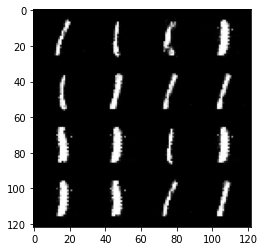

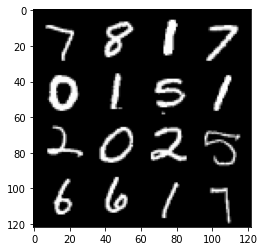

110: step 63300 / Gen loss: 3.6200640304883307 / disc_loss: 0.09786890639613073


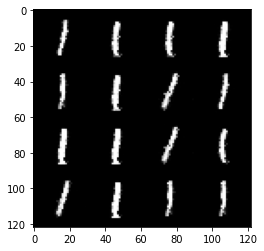

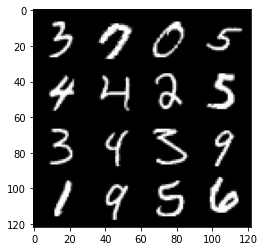

110: step 63600 / Gen loss: 3.7753417213757823 / disc_loss: 0.09800029585137968


  0%|          | 0/469 [00:00<?, ?it/s]

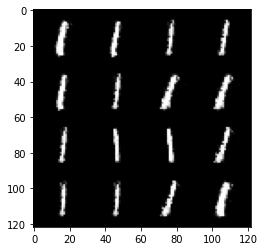

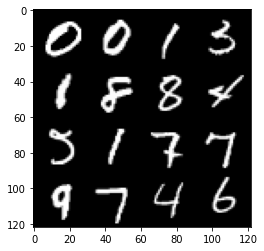

111: step 63900 / Gen loss: 3.556727620760601 / disc_loss: 0.11482299306119478


  0%|          | 0/469 [00:00<?, ?it/s]

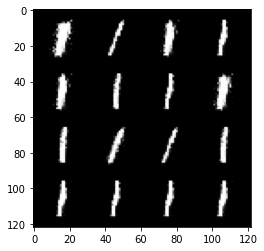

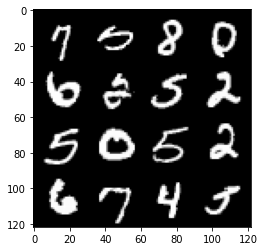

112: step 64200 / Gen loss: 3.7384926033020047 / disc_loss: 0.11541181193664672


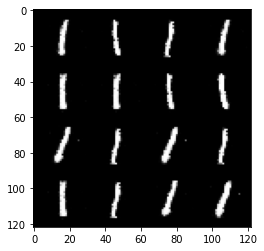

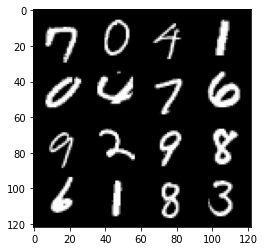

112: step 64500 / Gen loss: 3.4868002724647558 / disc_loss: 0.10369433537125582


  0%|          | 0/469 [00:00<?, ?it/s]

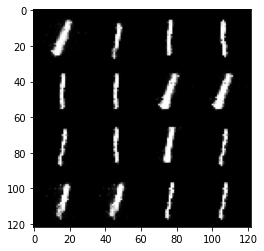

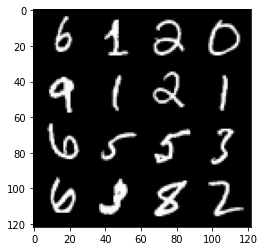

113: step 64800 / Gen loss: 3.553291633129118 / disc_loss: 0.09479097836340465


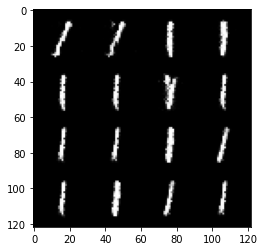

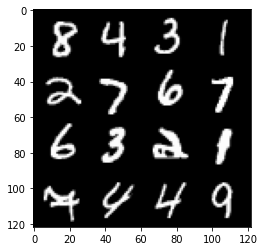

113: step 65100 / Gen loss: 3.5558492183685324 / disc_loss: 0.10579153766234718


  0%|          | 0/469 [00:00<?, ?it/s]

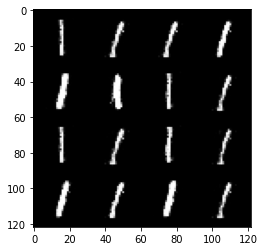

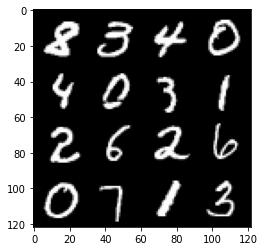

114: step 65400 / Gen loss: 3.6413353935877515 / disc_loss: 0.1021003572518627


  0%|          | 0/469 [00:00<?, ?it/s]

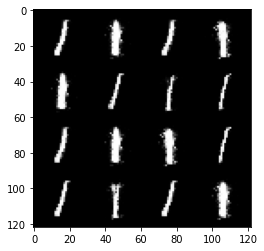

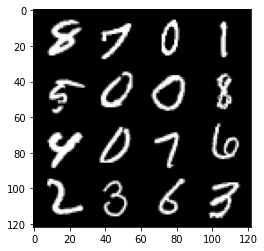

115: step 65700 / Gen loss: 3.5863464045524585 / disc_loss: 0.13127228060116355


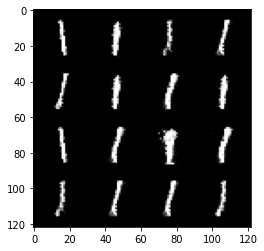

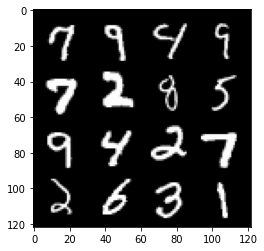

115: step 66000 / Gen loss: 4.02374676545461 / disc_loss: 0.10308213954170549


  0%|          | 0/469 [00:00<?, ?it/s]

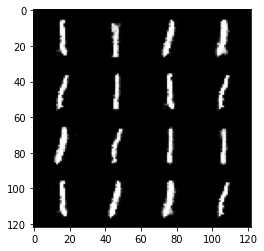

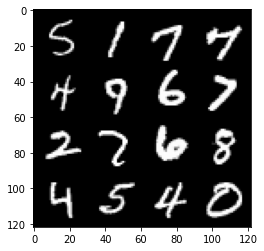

116: step 66300 / Gen loss: 3.7707076001167303 / disc_loss: 0.08173881880939003


  0%|          | 0/469 [00:00<?, ?it/s]

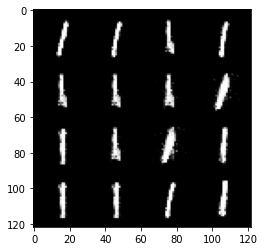

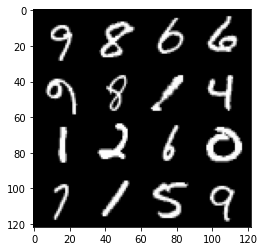

117: step 66600 / Gen loss: 3.652380233605702 / disc_loss: 0.10746733531355848


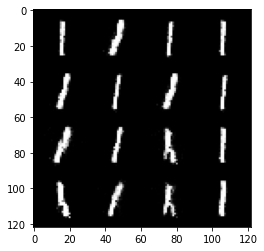

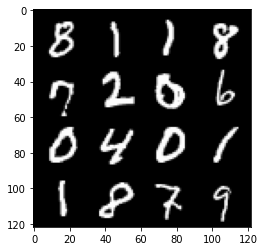

117: step 66900 / Gen loss: 3.656188273429872 / disc_loss: 0.10559511004015816


  0%|          | 0/469 [00:00<?, ?it/s]

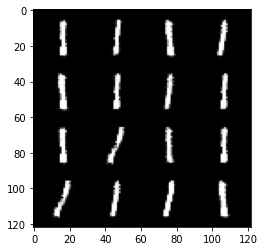

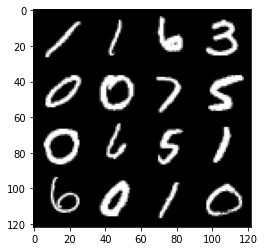

118: step 67200 / Gen loss: 3.493719094594319 / disc_loss: 0.1142259751508634


  0%|          | 0/469 [00:00<?, ?it/s]

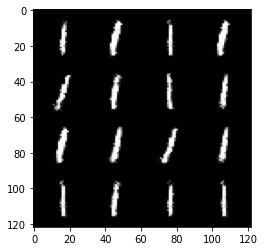

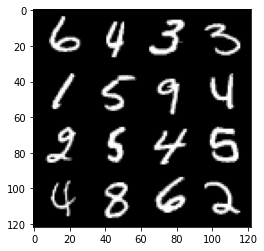

119: step 67500 / Gen loss: 3.4330294140179944 / disc_loss: 0.10344500059882807


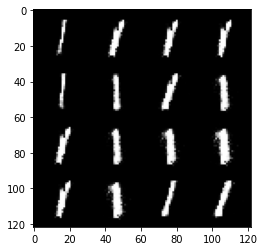

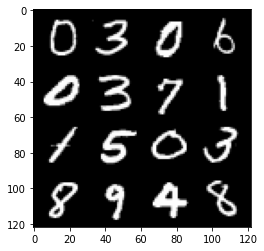

119: step 67800 / Gen loss: 3.6630181550979612 / disc_loss: 0.10336419841274617


  0%|          | 0/469 [00:00<?, ?it/s]

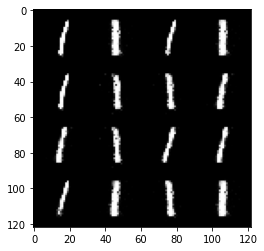

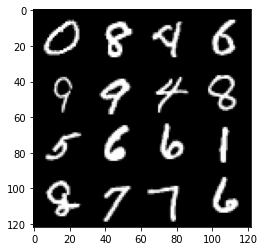

120: step 68100 / Gen loss: 3.6731659944852195 / disc_loss: 0.08736071217805153


  0%|          | 0/469 [00:00<?, ?it/s]

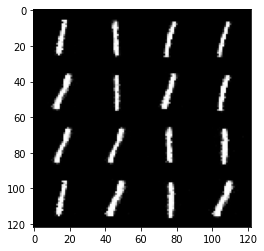

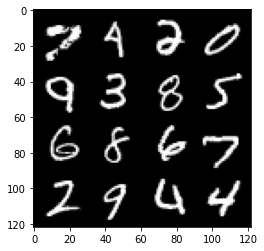

121: step 68400 / Gen loss: 3.7215804855028773 / disc_loss: 0.08276000633835791


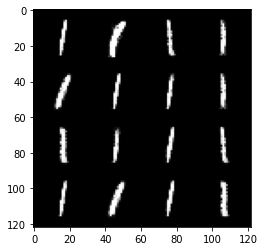

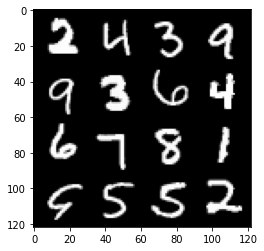

121: step 68700 / Gen loss: 3.508536103566486 / disc_loss: 0.10029073913892105


  0%|          | 0/469 [00:00<?, ?it/s]

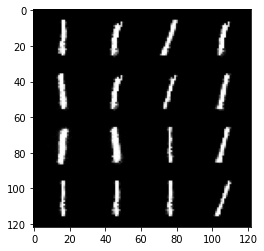

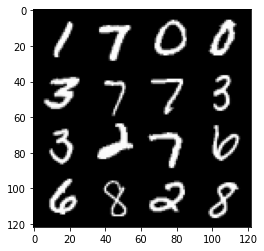

122: step 69000 / Gen loss: 3.6252872689565 / disc_loss: 0.09069050182277962


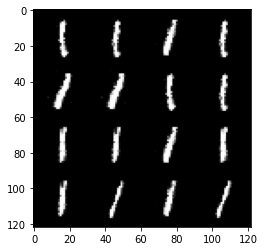

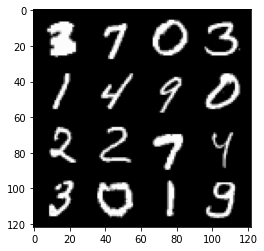

122: step 69300 / Gen loss: 3.5203678973515817 / disc_loss: 0.10610520008951431


  0%|          | 0/469 [00:00<?, ?it/s]

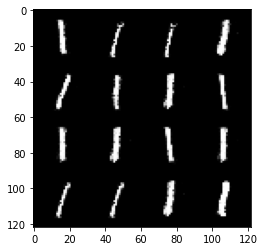

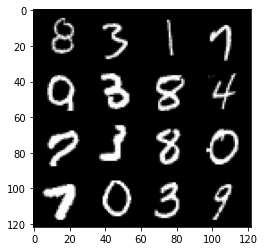

123: step 69600 / Gen loss: 3.625461998780569 / disc_loss: 0.1223778703063727


  0%|          | 0/469 [00:00<?, ?it/s]

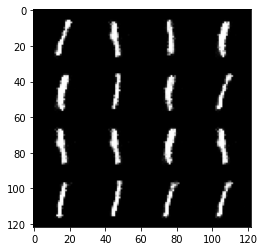

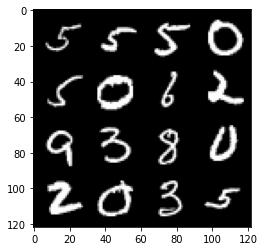

124: step 69900 / Gen loss: 3.625155565738679 / disc_loss: 0.0893301292757193


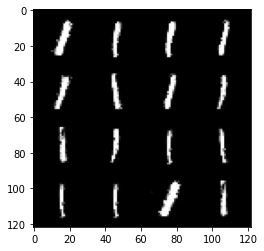

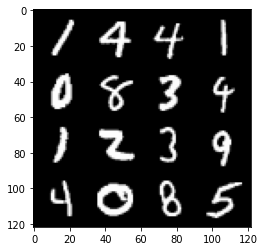

124: step 70200 / Gen loss: 3.626534297466279 / disc_loss: 0.11529249504829452


  0%|          | 0/469 [00:00<?, ?it/s]

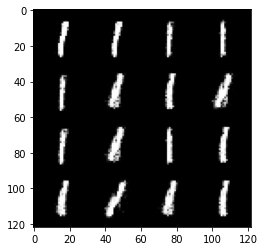

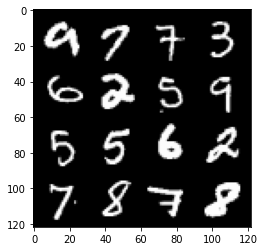

125: step 70500 / Gen loss: 3.7225132179260227 / disc_loss: 0.08830801912893851


  0%|          | 0/469 [00:00<?, ?it/s]

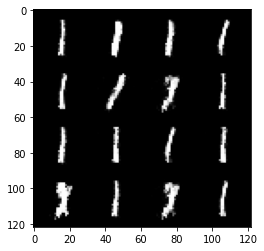

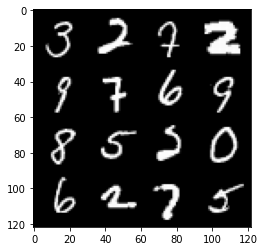

126: step 70800 / Gen loss: 3.5515541696548443 / disc_loss: 0.11098671294127896


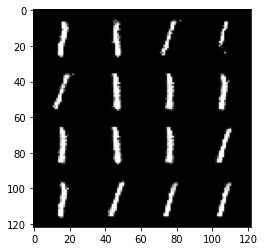

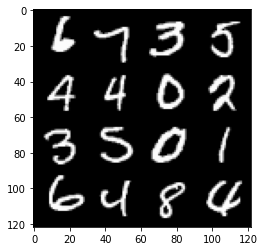

126: step 71100 / Gen loss: 3.55349801301956 / disc_loss: 0.09448186688746016


  0%|          | 0/469 [00:00<?, ?it/s]

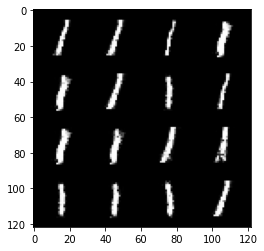

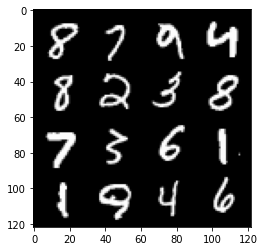

127: step 71400 / Gen loss: 3.48651402393977 / disc_loss: 0.11060658513257897


  0%|          | 0/469 [00:00<?, ?it/s]

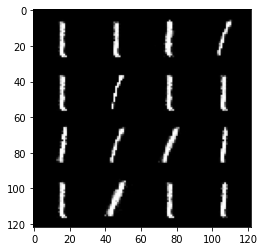

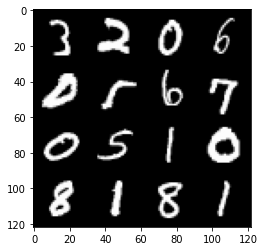

128: step 71700 / Gen loss: 3.4491587146123255 / disc_loss: 0.09652987905467551


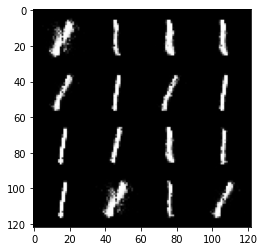

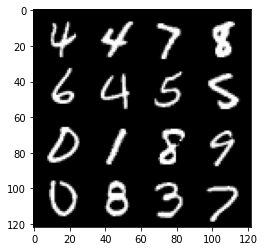

128: step 72000 / Gen loss: 3.84150333960851 / disc_loss: 0.1015670217759907


  0%|          | 0/469 [00:00<?, ?it/s]

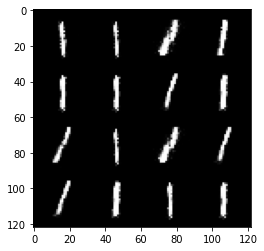

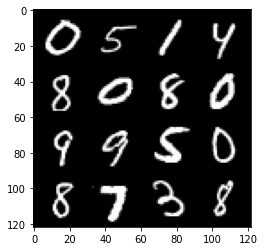

129: step 72300 / Gen loss: 3.481807900269826 / disc_loss: 0.13362831464037297


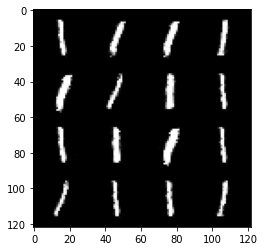

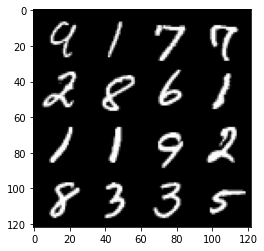

129: step 72600 / Gen loss: 3.4366975625356044 / disc_loss: 0.11073309360692897


  0%|          | 0/469 [00:00<?, ?it/s]

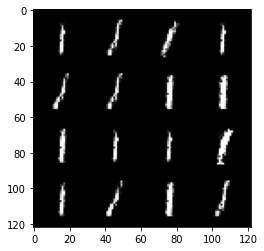

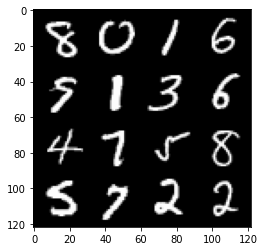

130: step 72900 / Gen loss: 3.4354314708709714 / disc_loss: 0.09887264937783283


  0%|          | 0/469 [00:00<?, ?it/s]

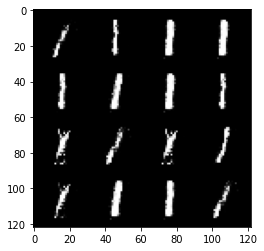

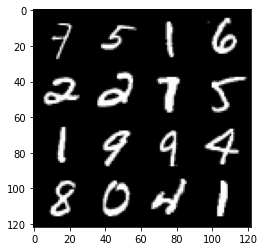

131: step 73200 / Gen loss: 3.6484597555796294 / disc_loss: 0.07334210683902104


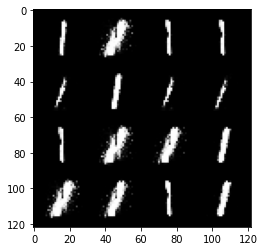

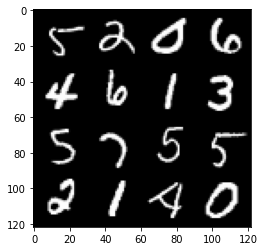

131: step 73500 / Gen loss: 3.985683348973591 / disc_loss: 0.06655749729213613


  0%|          | 0/469 [00:00<?, ?it/s]

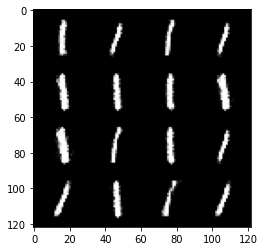

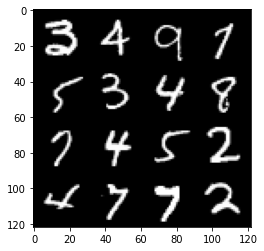

132: step 73800 / Gen loss: 3.643627312183378 / disc_loss: 0.11782011769091094


  0%|          | 0/469 [00:00<?, ?it/s]

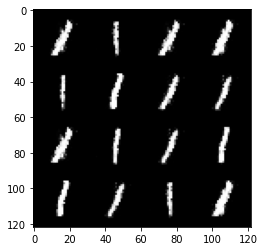

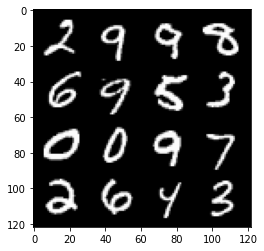

133: step 74100 / Gen loss: 3.606750876108806 / disc_loss: 0.10569867858663208


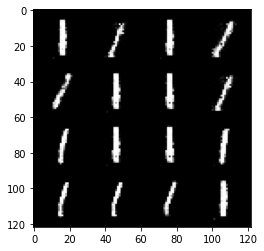

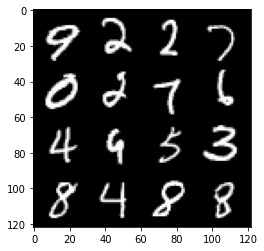

133: step 74400 / Gen loss: 3.523050091266634 / disc_loss: 0.10318402269234274


  0%|          | 0/469 [00:00<?, ?it/s]

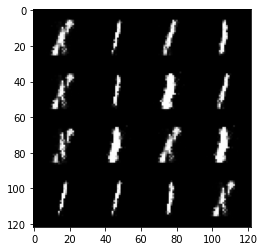

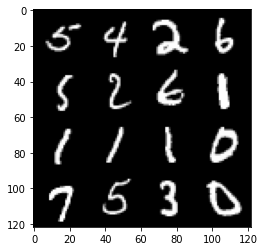

134: step 74700 / Gen loss: 3.3806155625979115 / disc_loss: 0.11086511716246597


  0%|          | 0/469 [00:00<?, ?it/s]

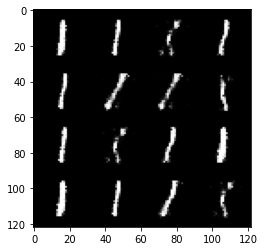

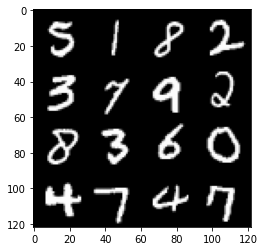

135: step 75000 / Gen loss: 3.716913313070931 / disc_loss: 0.07664579806228478


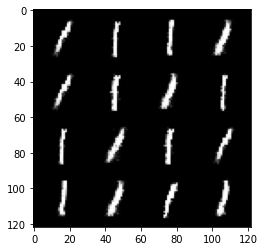

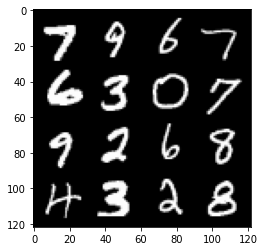

135: step 75300 / Gen loss: 3.541827398935956 / disc_loss: 0.098269876477619


  0%|          | 0/469 [00:00<?, ?it/s]

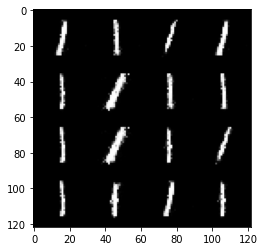

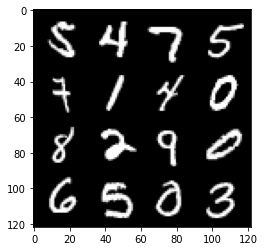

136: step 75600 / Gen loss: 3.41942422469457 / disc_loss: 0.13125739623482033


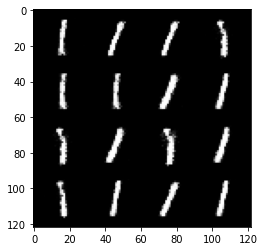

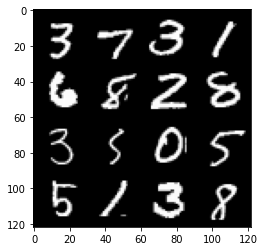

136: step 75900 / Gen loss: 3.613406110604602 / disc_loss: 0.10445311463748405


  0%|          | 0/469 [00:00<?, ?it/s]

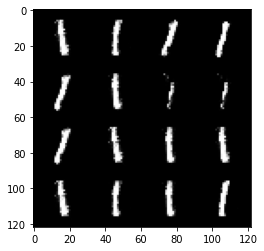

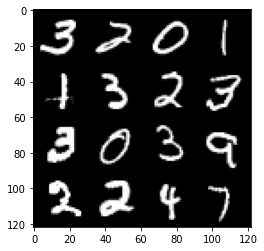

137: step 76200 / Gen loss: 3.733974742094676 / disc_loss: 0.11800830764075128


  0%|          | 0/469 [00:00<?, ?it/s]

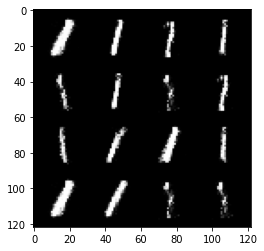

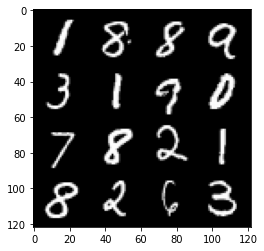

138: step 76500 / Gen loss: 3.635737818082173 / disc_loss: 0.10537104690447455


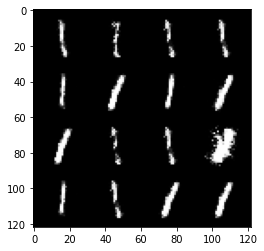

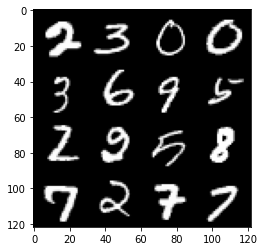

138: step 76800 / Gen loss: 3.5044951224327083 / disc_loss: 0.1326669927686452


  0%|          | 0/469 [00:00<?, ?it/s]

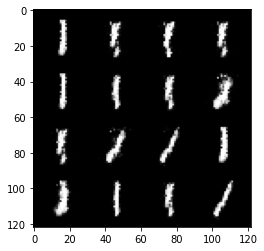

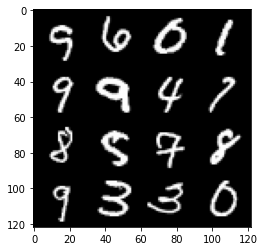

139: step 77100 / Gen loss: 3.5170699572563167 / disc_loss: 0.11812697219351931


  0%|          | 0/469 [00:00<?, ?it/s]

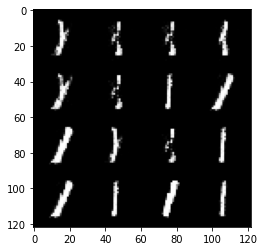

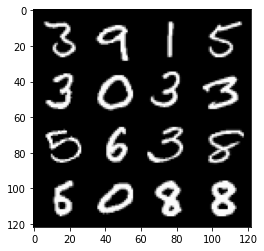

140: step 77400 / Gen loss: 3.702032781442006 / disc_loss: 0.10646234236657631


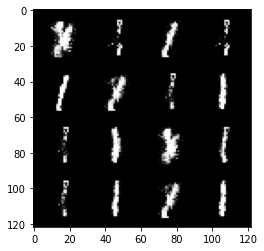

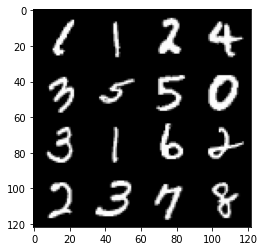

140: step 77700 / Gen loss: 3.9760516929626486 / disc_loss: 0.09282964530711374


  0%|          | 0/469 [00:00<?, ?it/s]

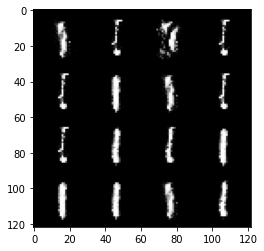

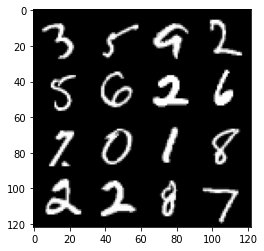

141: step 78000 / Gen loss: 3.981579054196676 / disc_loss: 0.08513402578731379


  0%|          | 0/469 [00:00<?, ?it/s]

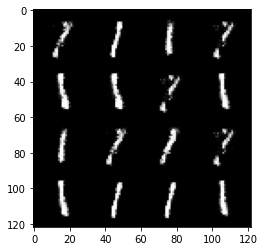

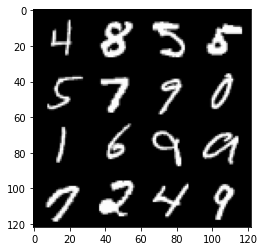

142: step 78300 / Gen loss: 3.7335411230723055 / disc_loss: 0.11013880990445613


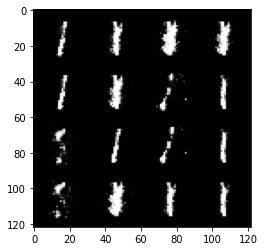

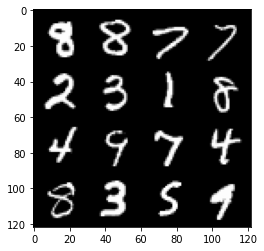

142: step 78600 / Gen loss: 3.5179516228040084 / disc_loss: 0.11661199664697058


  0%|          | 0/469 [00:00<?, ?it/s]

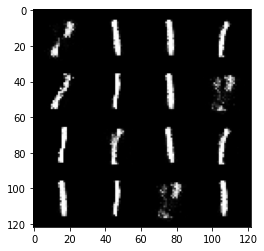

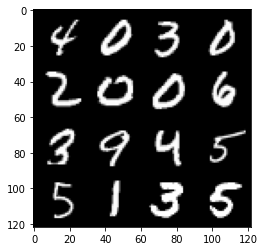

143: step 78900 / Gen loss: 4.095132922331494 / disc_loss: 0.09551718427489198


  0%|          | 0/469 [00:00<?, ?it/s]

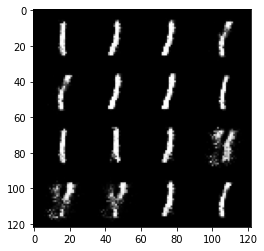

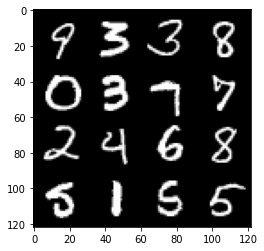

144: step 79200 / Gen loss: 3.5317798336346944 / disc_loss: 0.11884892576684555


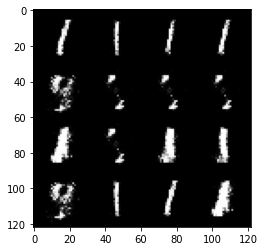

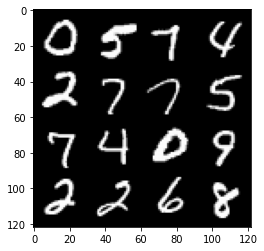

144: step 79500 / Gen loss: 3.369569620291392 / disc_loss: 0.12480945075551671


  0%|          | 0/469 [00:00<?, ?it/s]

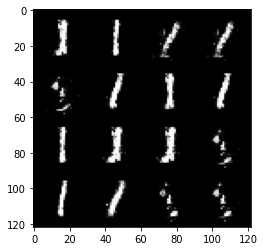

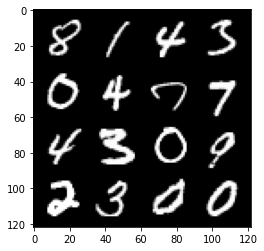

145: step 79800 / Gen loss: 3.4794907776514705 / disc_loss: 0.09367644203205908


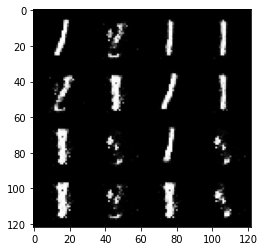

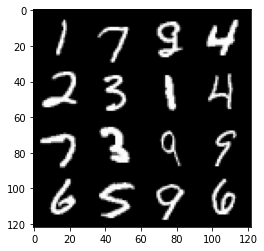

145: step 80100 / Gen loss: 3.8392438379923512 / disc_loss: 0.08112767157455285


  0%|          | 0/469 [00:00<?, ?it/s]

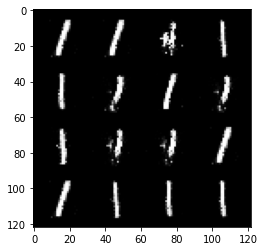

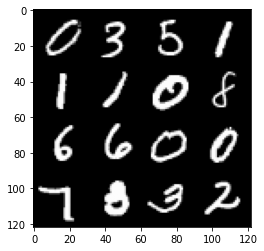

146: step 80400 / Gen loss: 3.7542450348536147 / disc_loss: 0.08724467822040118


  0%|          | 0/469 [00:00<?, ?it/s]

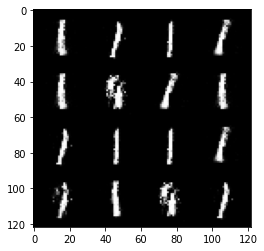

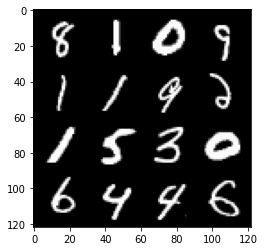

147: step 80700 / Gen loss: 3.8965316478411376 / disc_loss: 0.10953731914361312


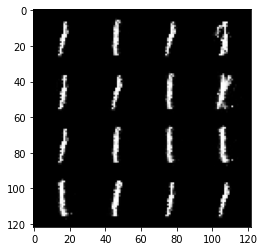

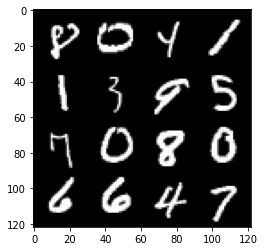

147: step 81000 / Gen loss: 3.4995973952611297 / disc_loss: 0.1080057597905397


  0%|          | 0/469 [00:00<?, ?it/s]

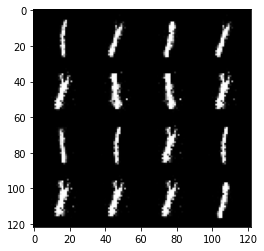

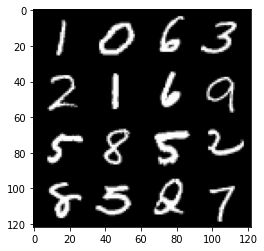

148: step 81300 / Gen loss: 3.676484016577403 / disc_loss: 0.07230116026476019


  0%|          | 0/469 [00:00<?, ?it/s]

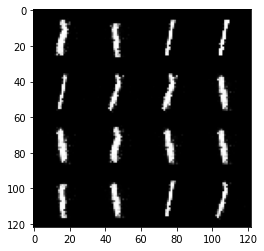

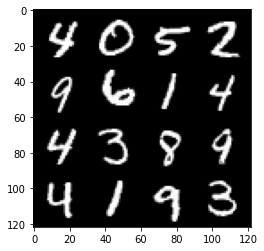

149: step 81600 / Gen loss: 3.9326665997505206 / disc_loss: 0.07641663214191793


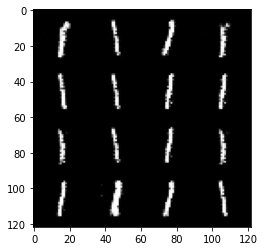

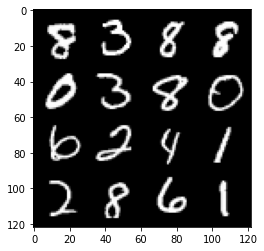

149: step 81900 / Gen loss: 3.7013458053271 / disc_loss: 0.08146974975864084


  0%|          | 0/469 [00:00<?, ?it/s]

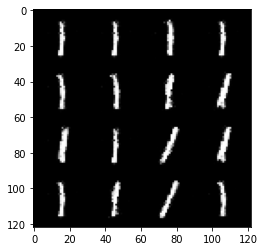

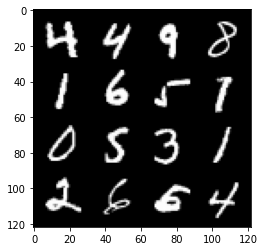

150: step 82200 / Gen loss: 3.6252933867772423 / disc_loss: 0.12328707346692688


  0%|          | 0/469 [00:00<?, ?it/s]

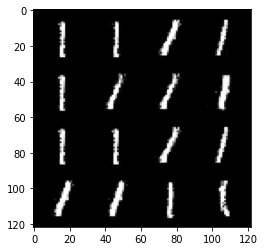

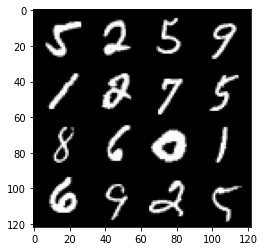

151: step 82500 / Gen loss: 3.590146401723223 / disc_loss: 0.11460845460494355


In [ ]:
for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    # Discriminator
    disc_opt.zero_grad()

    cur_bs = len(real)            # real: 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1)  # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)

    disc_loss.backward(retain_graph=True) # Optinal for storing value
    disc_opt.step()

    # Generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func, gen, disc, cur_bs, z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    # Visualization and stat
    mean_disc_loss += disc_loss.item() / info_step
    mean_gen_loss += gen_loss.item() / info_step

    if cur_step % info_step == 0 and cur_step > 0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss = 0, 0
    cur_step += 1

In [ ]:
!nvidia-smi